In [1]:
library(Seurat)
library(dplyr)
library(ggplot2)
library(viridis)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, saveRDS


Loading Seurat v5 beta version 
To maintain compatibility with previous workflows, new Seurat objects will use the previous object structure by default
To use new Seurat v5 assays: Please run: options(Seurat.object.assay.version = 'v5')


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Loading required package: viridisLite



In [2]:
immune.combined <- readRDS(file = 'immune_clean_ped_only.rds')

In [3]:
immune.combined <- SetIdent(immune.combined, value = 'stim')
pma_tcr <- subset(immune.combined, idents = c('Unstim', 'PMA', 'TCR'))

In [4]:
rm(immune.combined)

In [5]:
pma_tcr

An object of class Seurat 
20222 features across 63508 samples within 3 assays 
Active assay: integrated (2000 features, 2000 variable features)
 2 layers present: data, scale.data
 2 other assays present: RNA, ADT
 2 dimensional reductions calculated: pca, umap

# Standard Clustering

In [6]:
DefaultAssay(pma_tcr) <- 'RNA'
pma_tcr <- NormalizeData(pma_tcr) %>% FindVariableFeatures() %>% ScaleData() %>% RunPCA()

Warning message:
“The following arguments are not used: nselect”
Centering and scaling data matrix

PC_ 1 
Positive:  NFKBID, SPRY1, SLAMF1, ODC1, NR4A3, EGR2, FABP5, TNFSF14, IRF8, CRTAM 
	   SEMA7A, PRNP, GEM, INSIG1, CPD, RGCC, GADD45A, VSIR, NAMPT, HK2 
	   SLA, DUSP2, CD200, NR4A2, ELL2, PRDX1, EPOP, IL23A, PFKP, SLC43A3 
Negative:  CXCR4, ETS1, GIMAP7, PIK3IP1, KLF2, CCR7, FAM102A, RIPOR2, AKNA, SLFN5 
	   SPOCK2, LTB, GIMAP4, S1PR4, SUN2, PRMT2, CORO1A, MGAT4A, ARL4C, TXNIP 
	   NLRC5, PACS1, ARHGAP45, BCL3, GRK2, PDE3B, DEF6, NELL2, FMNL1, PRKACB 
PC_ 2 
Positive:  STAT1, SELL, LRRN3, NELL2, GBP1, GBP4, GBP5, IRF1, HAPLN3, PKIA 
	   ABLIM1, NT5E, MYB, APOL6, PSAT1, JAML, CCR7, EZH2, IFNGR2, MPZL2 
	   ZC3H12D, DTX3L, HK2, DEAF1, KCTD12, USP14, POU2F2, GLIPR1, IRF8, PTPRK 
Negative:  CCL5, NKG7, KLRD1, APOBEC3G, CCL4, CST7, CCL4L2, CCL3, PLEK, IFNG 
	   XCL2, NIBAN1, PRF1, XCL1, APOBEC3C, CCL3L1, TNF, ARID5B, GNLY, GZMB 
	   PYHIN1, MAF, ZEB2, CD58, CSF2, SLAMF7, HOPX, IGF2R, TI

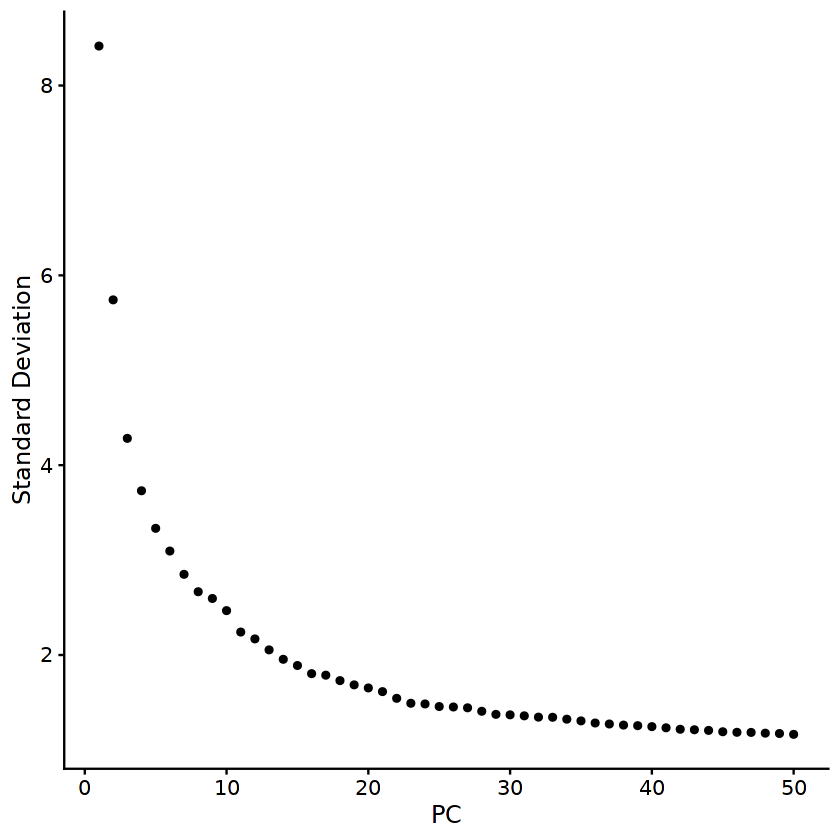

In [7]:
ElbowPlot(pma_tcr, ndims = 50)

In [8]:
pma_tcr <- RunUMAP(pma_tcr, dims = 1:25) %>% FindNeighbors(dims = 1:25) %>% FindClusters(resolution = 0.5)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
20:51:13 UMAP embedding parameters a = 0.9922 b = 1.112

20:51:13 Read 63508 rows and found 25 numeric columns

20:51:13 Using Annoy for neighbor search, n_neighbors = 30

20:51:13 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

20:51:22 Writing NN index file to temp file /tmp/RtmpxxtJyG/file4302b39cc0ec2

20:51:22 Searching Annoy index using 1 thread, search_k = 3000

20:51:47 Annoy recall = 100%

20:51:47 Commencing smooth kNN distance calibration using 1 thread
 with target n_neighbors

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 63508
Number of edges: 1905876

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9073
Number of communities: 16
Elapsed time: 40 seconds


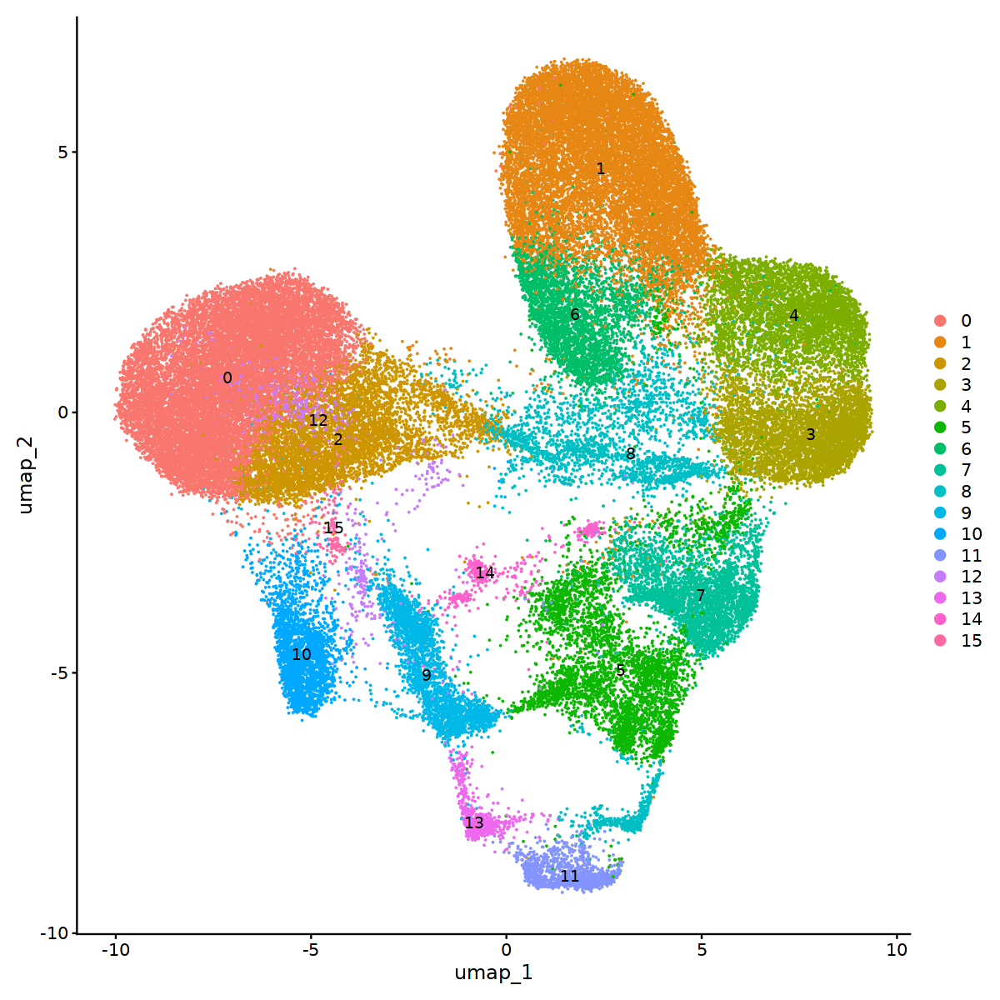

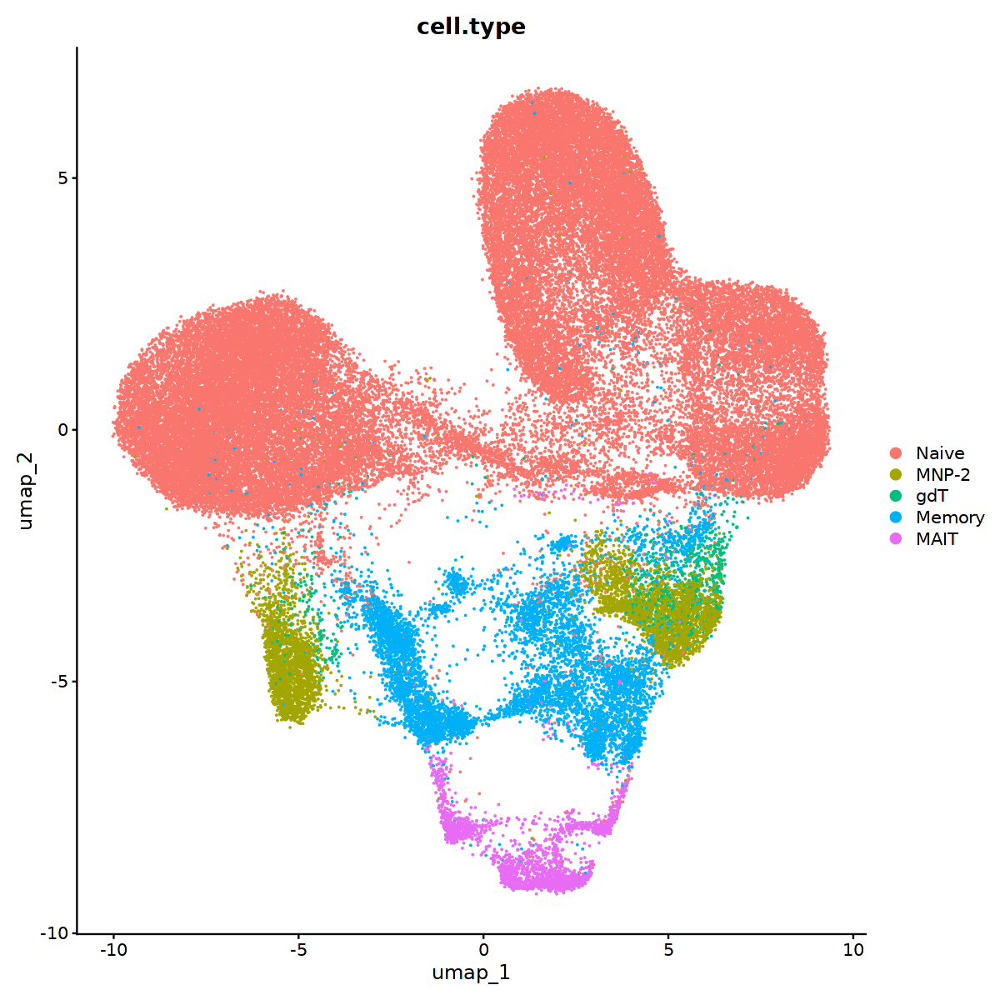

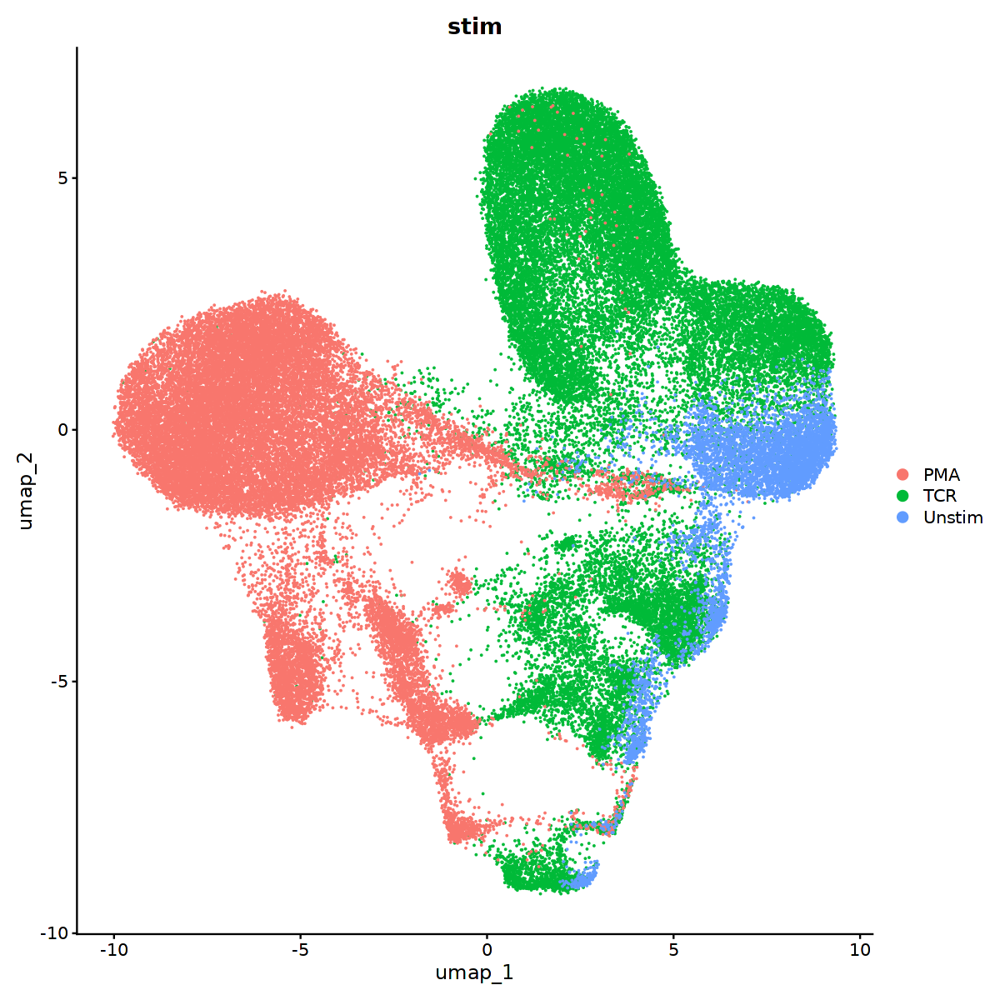

In [9]:
options(repr.plot.width = 10, repr.plot.height = 10)
DimPlot(pma_tcr, label = TRUE)
DimPlot(pma_tcr, group.by = 'cell.type')
DimPlot(pma_tcr, group.by = 'stim') 

In [10]:
pma_tcr$celltype_stim <- paste0(pma_tcr$cell.type, '_', pma_tcr$stim)
pma_tcr$stim_celltype <- paste0(pma_tcr$stim, '_', pma_tcr$cell.type)

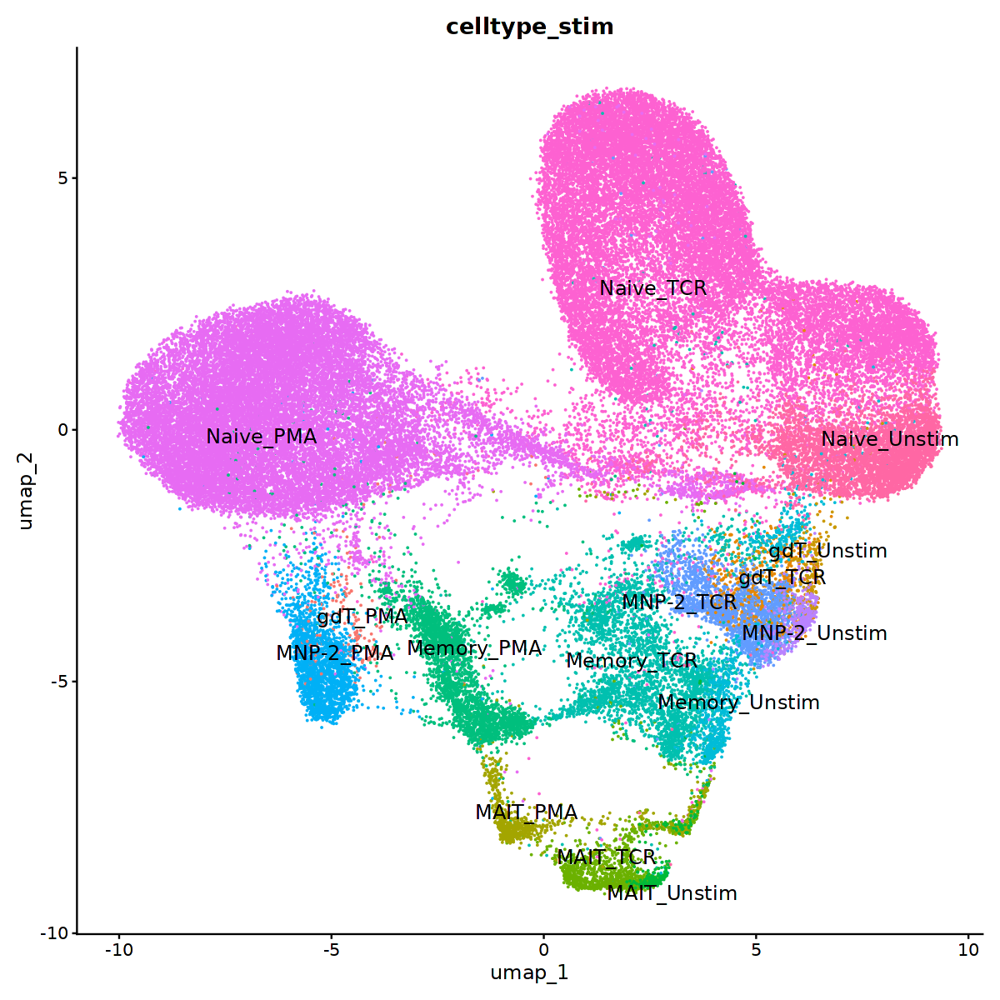

In [11]:
DimPlot(pma_tcr, group.by = 'celltype_stim', label = TRUE, repel = TRUE, label.size = 5) & NoLegend()

# Fig 8B

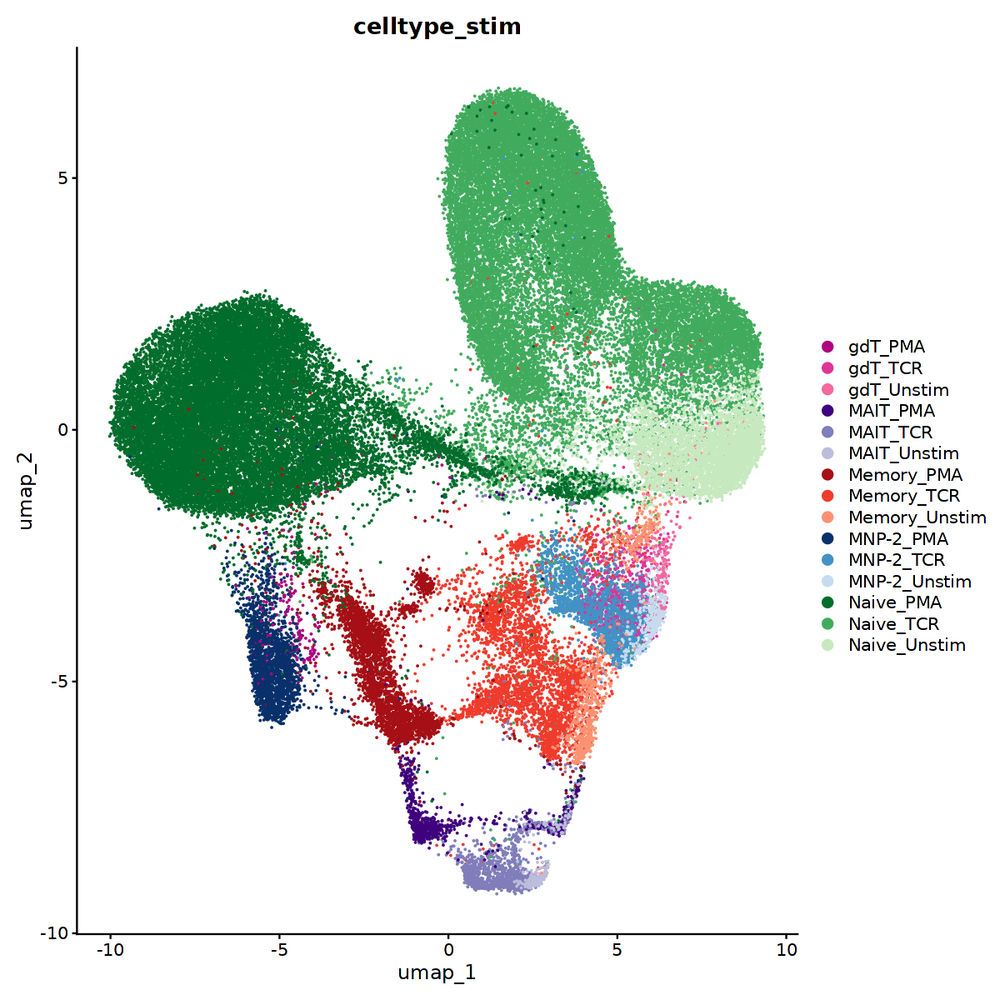

In [109]:
options(repr.plot.width = 10, repr.plot.height = 10)
DimPlot(pma_tcr, group.by = 'celltype_stim', 
        cols = c('#ae017e','#dd3497','#f768a1',
                 '#3f007d','#807dba','#bcbddc',
                 '#a50f15','#ef3b2c','#fc9272',
                 '#08306b','#4292c6','#c6dbef',
                 '#006d2c','#41ab5d','#c7e9c0'))

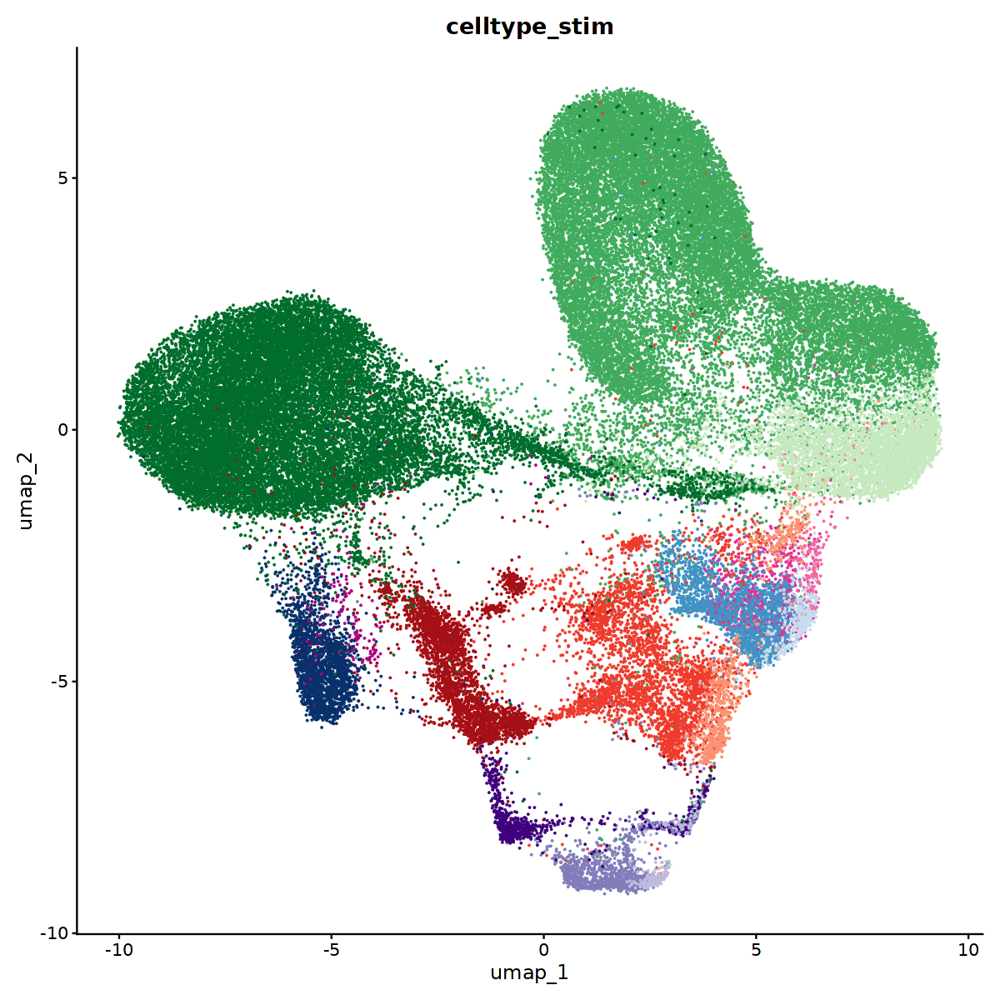

In [110]:
options(repr.plot.width = 10, repr.plot.height = 10)
DimPlot(pma_tcr, group.by = 'celltype_stim', 
        cols = c('#ae017e','#dd3497','#f768a1',
                 '#3f007d','#807dba','#bcbddc',
                 '#a50f15','#ef3b2c','#fc9272',
                 '#08306b','#4292c6','#c6dbef',
                 '#006d2c','#41ab5d','#c7e9c0')) & NoLegend()

In [112]:
# Open a pdf file
pdf("plots/pma_tcr_umap_celltype.pdf", width = 10, height = 10) 
# 2. Create a plot
DimPlot(pma_tcr, group.by = 'celltype_stim', 
        cols = c('#ae017e','#dd3497','#f768a1',
                 '#3f007d','#807dba','#bcbddc',
                 '#a50f15','#ef3b2c','#fc9272',
                 '#08306b','#4292c6','#c6dbef',
                 '#006d2c','#41ab5d','#c7e9c0')) & NoLegend()
# Close the pdf file
dev.off() 

png 
  2

In [312]:
# Open a pdf file
pdf("plots/pma_tcr_umap_celltype_wLegend.pdf", width = 10, height = 10) 
# 2. Create a plot
DimPlot(pma_tcr, group.by = 'celltype_stim', 
        cols = c('#ae017e','#dd3497','#f768a1',
                 '#3f007d','#807dba','#bcbddc',
                 '#a50f15','#ef3b2c','#fc9272',
                 '#08306b','#4292c6','#c6dbef',
                 '#006d2c','#41ab5d','#c7e9c0'))
# Close the pdf file
dev.off() 

png 
  2

# TCR DEGs

In [81]:
pma_tcr <- SetIdent(pma_tcr, value = 'stim')
tcr <- subset(pma_tcr, idents = c('Unstim','TCR'))

In [82]:
tcr_split <- SplitObject(tcr, split.by = 'cell.type')

In [86]:
tcr_deg_list <- lapply(tcr_split, function(x){
    degs <- FindMarkers(x, group.by = 'stim', `ident.1` = 'TCR', `ident.2` = 'Unstim')
    return(degs)
})

In [90]:
genes_of_interest_tcr <- unique(c(rownames(tcr_deg_list$Naive[1:25,]),rownames(tcr_deg_list$Memory[1:25,]),rownames(tcr_deg_list$MAIT[1:25,]),rownames(tcr_deg_list$gdT[1:25,]),
       rownames(tcr_deg_list$`MNP-2`[1:25,])))  

# PMA DEGs

In [ ]:
pma_tcr <- SetIdent(pma_tcr, value = 'stim')
pma <- subset(pma_tcr, idents = c('Unstim','PMA'))

In [ ]:
pma_split <- SplitObject(pma, split.by = 'cell.type')

In [ ]:
pma_deg_list <- lapply(pma_split, function(x){
    degs <- FindMarkers(x, group.by = 'stim', `ident.1` = 'PMA', `ident.2` = 'Unstim')
    return(degs)
})

In [ ]:
genes_of_interest_pma <- unique(c(rownames(pma_deg_list$Naive[1:25,]),rownames(pma_deg_list$Memory[1:25,]),rownames(pma_deg_list$MAIT[1:25,]),rownames(pma_deg_list$gdT[1:25,]),
       rownames(pma_deg_list$`MNP-2`[1:25,]))) 

In [78]:
names(deg_list) <- names(pma_split)
names(deg_list)

[1] "Naive"  "Memory" "MNP-2"  "MAIT"   "gdT"

# Fig 8C

In [84]:
library(pheatmap)

In [91]:
avg_exp <- AverageExpression(pma_tcr, assays = 'RNA', features = unique(c(genes_of_interest_pma, genes_of_interest_tcr)), group.by = 'celltype_stim')

Warning message:
“`invoke()` is deprecated as of rlang 0.4.0.
Please use `exec()` or `inject()` instead.
This warning is displayed once every 8 hours.”


In [92]:
avg_exp <- as.data.frame(avg_exp$RNA)

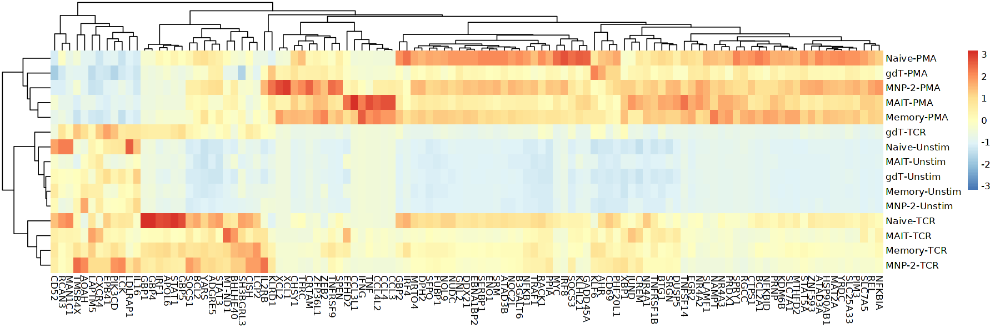

In [129]:
options(repr.plot.width = 15, repr.plot.height = 5)
p <- pheatmap(t(avg_exp), scale = 'column')

In [130]:
save_pheatmap_pdf <- function(x, filename, width=15, height=5) {
   stopifnot(!missing(x))
   stopifnot(!missing(filename))
   pdf(filename, width=width, height=height)
   grid::grid.newpage()
   grid::grid.draw(x$gtable)
   dev.off()
}
save_pheatmap_pdf(p, "plots/pma_tcr_heatmap.pdf")

png 
  2

# Fig 8D

In [65]:
df_build <- function(seurat_object){
    meta <- seurat_object@meta.data
    meta$IFNG <- as.vector(seurat_object@assays$RNA@data['IFNG',])
    meta$TNF <- as.vector(seurat_object@assays$RNA@data['TNF',])
    meta$IL2 <- as.vector(seurat_object@assays$RNA@data['IL2',])
    meta$PRF1 <- as.vector(seurat_object@assays$RNA@data['PRF1',])
    meta$GZMB <- as.vector(seurat_object@assays$RNA@data['GZMB',])
    return(meta)}

In [66]:
pma_tcr <- SetIdent(pma_tcr, value = 'cell.type')
pma_tcr_subset <- subset(pma_tcr, idents = c('Naive','Memory','MNP-2'))

In [67]:
marker_df <- df_build(pma_tcr_subset)

In [68]:
table(pma_tcr_subset$celltype_stim)


   Memory_PMA    Memory_TCR Memory_Unstim     MNP-2_PMA     MNP-2_TCR 
         3130          3603           721          2172          2256 
 MNP-2_Unstim     Naive_PMA     Naive_TCR  Naive_Unstim 
          368         20633         23029          4210 

In [134]:
install.packages('ggdist')
install.packages('gghalves')
install.packages("ggbeeswarm")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [12]:
library(ggdist)
library(gghalves)
library(ggbeeswarm)

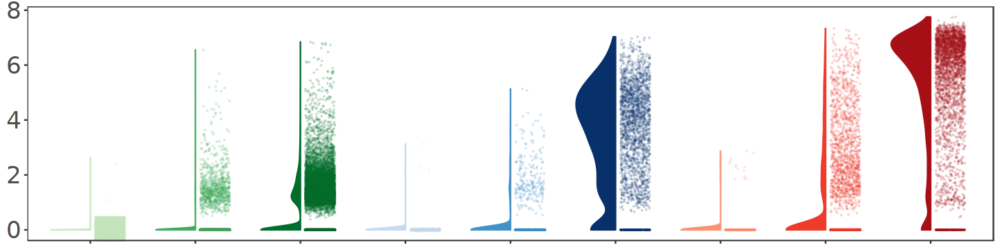

In [180]:
options(repr.plot.width = 12, repr.plot.height = 3)
marker_df %>% 
    mutate(celltype_stim = factor(celltype_stim, levels = c('Naive_Unstim','Naive_TCR','Naive_PMA','MNP-2_Unstim','MNP-2_TCR','MNP-2_PMA',
                                                            'Memory_Unstim','Memory_TCR','Memory_PMA'))) %>%
    ggplot(aes(x = celltype_stim, y = IFNG, fill=celltype_stim, color=celltype_stim)) + 
      geom_half_point(size = 0.1, alpha = 0.15) +
      geom_half_violin(scale = 'width') +
      scale_color_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      scale_fill_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      theme_bw() +
      theme(axis.text.x = element_blank(),
            axis.title.x = element_blank(),
            axis.text.y = element_text(size = 20),
            axis.title.y = element_blank(),
            legend.position = 'none',
            panel.grid.major = element_blank(), 
            panel.grid.minor = element_blank())

In [181]:
# Open a pdf file
pdf("plots/stim_IFNG.pdf", width = 12, height = 3) 
# 2. Create a plot
marker_df %>% 
    mutate(celltype_stim = factor(celltype_stim, levels = c('Naive_Unstim','Naive_TCR','Naive_PMA','MNP-2_Unstim','MNP-2_TCR','MNP-2_PMA',
                                                            'Memory_Unstim','Memory_TCR','Memory_PMA'))) %>%
    ggplot(aes(x = celltype_stim, y = IFNG, fill=celltype_stim, color=celltype_stim)) + 
      geom_half_point(size = 0.1, alpha = 0.15) +
      geom_half_violin(scale = 'width') +
      scale_color_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      scale_fill_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      theme_bw() +
      theme(axis.text.x = element_blank(),
            axis.title.x = element_blank(),
            axis.text.y = element_text(size = 20),
            axis.title.y = element_blank(),
            legend.position = 'none',
            panel.grid.major = element_blank(), 
            panel.grid.minor = element_blank())
# Close the pdf file
dev.off()

png 
  2

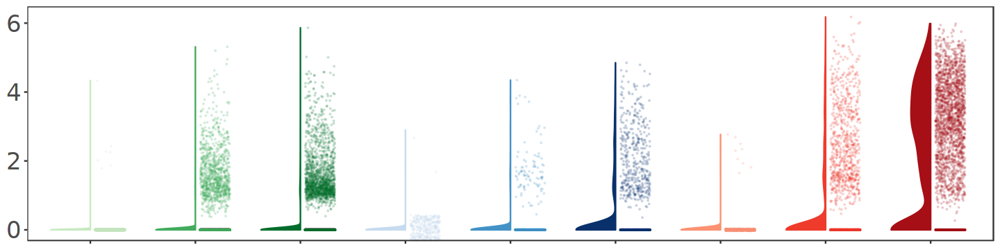

In [182]:
options(repr.plot.width = 12, repr.plot.height = 3)
marker_df %>% 
    mutate(celltype_stim = factor(celltype_stim, levels = c('Naive_Unstim','Naive_TCR','Naive_PMA','MNP-2_Unstim','MNP-2_TCR','MNP-2_PMA',
                                                            'Memory_Unstim','Memory_TCR','Memory_PMA'))) %>%
    ggplot(aes(x = celltype_stim, y = TNF, fill=celltype_stim, color=celltype_stim)) + 
      geom_half_point(size = 0.1, alpha = 0.15) +
      geom_half_violin(scale = 'width') +
      scale_color_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      scale_fill_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      theme_bw() +
      theme(axis.text.x = element_blank(),
            axis.title.x = element_blank(),
            axis.text.y = element_text(size = 20),
            axis.title.y = element_blank(),
            legend.position = 'none',
            panel.grid.major = element_blank(), 
            panel.grid.minor = element_blank())

In [183]:
# Open a pdf file
pdf("plots/stim_TNF.pdf", width = 12, height = 3) 
# 2. Create a plot
marker_df %>% 
    mutate(celltype_stim = factor(celltype_stim, levels = c('Naive_Unstim','Naive_TCR','Naive_PMA','MNP-2_Unstim','MNP-2_TCR','MNP-2_PMA',
                                                            'Memory_Unstim','Memory_TCR','Memory_PMA'))) %>%
    ggplot(aes(x = celltype_stim, y = TNF, fill=celltype_stim, color=celltype_stim)) + 
      geom_half_point(size = 0.1, alpha = 0.15) +
      geom_half_violin(scale = 'width') +
      scale_color_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      scale_fill_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      theme_bw() +
      theme(axis.text.x = element_blank(),
            axis.title.x = element_blank(),
            axis.text.y = element_text(size = 20),
            axis.title.y = element_blank(),
            legend.position = 'none',
            panel.grid.major = element_blank(), 
            panel.grid.minor = element_blank())
# Close the pdf file
dev.off()

png 
  2

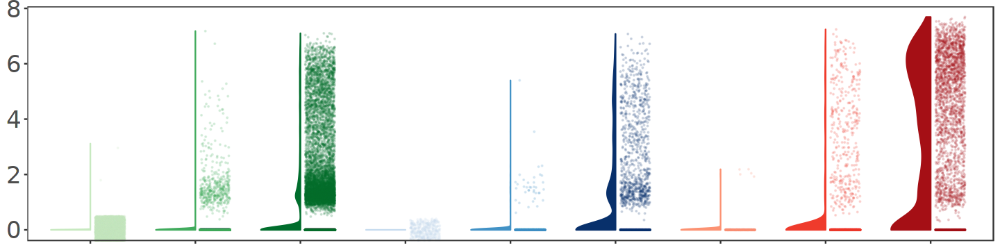

In [184]:
options(repr.plot.width = 12, repr.plot.height = 3)
marker_df %>% 
    mutate(celltype_stim = factor(celltype_stim, levels = c('Naive_Unstim','Naive_TCR','Naive_PMA','MNP-2_Unstim','MNP-2_TCR','MNP-2_PMA',
                                                            'Memory_Unstim','Memory_TCR','Memory_PMA'))) %>%
    ggplot(aes(x = celltype_stim, y = IL2, fill=celltype_stim, color=celltype_stim)) + 
      geom_half_point(size = 0.1, alpha = 0.15) +
      geom_half_violin(scale = 'width') +
      scale_color_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      scale_fill_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      theme_bw() +
      theme(axis.text.x = element_blank(),
            axis.title.x = element_blank(),
            axis.text.y = element_text(size = 20),
            axis.title.y = element_blank(),
            legend.position = 'none',
            panel.grid.major = element_blank(), 
            panel.grid.minor = element_blank())

In [185]:
# Open a pdf file
pdf("plots/stim_IL2.pdf", width = 12, height = 3) 
# 2. Create a plot
marker_df %>% 
    mutate(celltype_stim = factor(celltype_stim, levels = c('Naive_Unstim','Naive_TCR','Naive_PMA','MNP-2_Unstim','MNP-2_TCR','MNP-2_PMA',
                                                            'Memory_Unstim','Memory_TCR','Memory_PMA'))) %>%
    ggplot(aes(x = celltype_stim, y = IL2, fill=celltype_stim, color=celltype_stim)) + 
      geom_half_point(size = 0.1, alpha = 0.15) +
      geom_half_violin(scale = 'width') +
      scale_color_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      scale_fill_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      theme_bw() +
      theme(axis.text.x = element_blank(),
            axis.title.x = element_blank(),
            axis.text.y = element_text(size = 20),
            axis.title.y = element_blank(),
            legend.position = 'none',
            panel.grid.major = element_blank(), 
            panel.grid.minor = element_blank())
# Close the pdf file
dev.off()

png 
  2

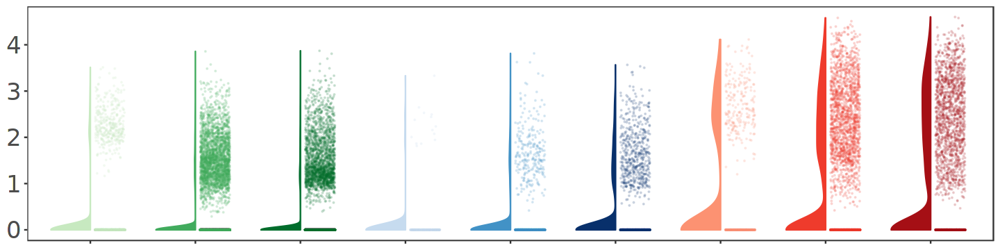

In [186]:
options(repr.plot.width = 12, repr.plot.height = 3)
marker_df %>% 
    mutate(celltype_stim = factor(celltype_stim, levels = c('Naive_Unstim','Naive_TCR','Naive_PMA','MNP-2_Unstim','MNP-2_TCR','MNP-2_PMA',
                                                            'Memory_Unstim','Memory_TCR','Memory_PMA'))) %>%
    ggplot(aes(x = celltype_stim, y = PRF1, fill=celltype_stim, color=celltype_stim)) + 
      geom_half_point(size = 0.1, alpha = 0.15) +
      geom_half_violin(scale = 'width') +
      scale_color_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      scale_fill_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      theme_bw() +
      theme(axis.text.x = element_blank(),
            axis.title.x = element_blank(),
            axis.text.y = element_text(size = 20),
            axis.title.y = element_blank(),
            legend.position = 'none',
            panel.grid.major = element_blank(), 
            panel.grid.minor = element_blank())

In [187]:
# Open a pdf file
pdf("plots/stim_PRF1.pdf", width = 12, height = 3) 
# 2. Create a plot
marker_df %>% 
    mutate(celltype_stim = factor(celltype_stim, levels = c('Naive_Unstim','Naive_TCR','Naive_PMA','MNP-2_Unstim','MNP-2_TCR','MNP-2_PMA',
                                                            'Memory_Unstim','Memory_TCR','Memory_PMA'))) %>%
    ggplot(aes(x = celltype_stim, y = PRF1, fill=celltype_stim, color=celltype_stim)) + 
      geom_half_point(size = 0.1, alpha = 0.15) +
      geom_half_violin(scale = 'width') +
      scale_color_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      scale_fill_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      theme_bw() +
      theme(axis.text.x = element_blank(),
            axis.title.x = element_blank(),
            axis.text.y = element_text(size = 20),
            axis.title.y = element_blank(),
            legend.position = 'none',
            panel.grid.major = element_blank(), 
            panel.grid.minor = element_blank())
# Close the pdf file
dev.off()

png 
  2

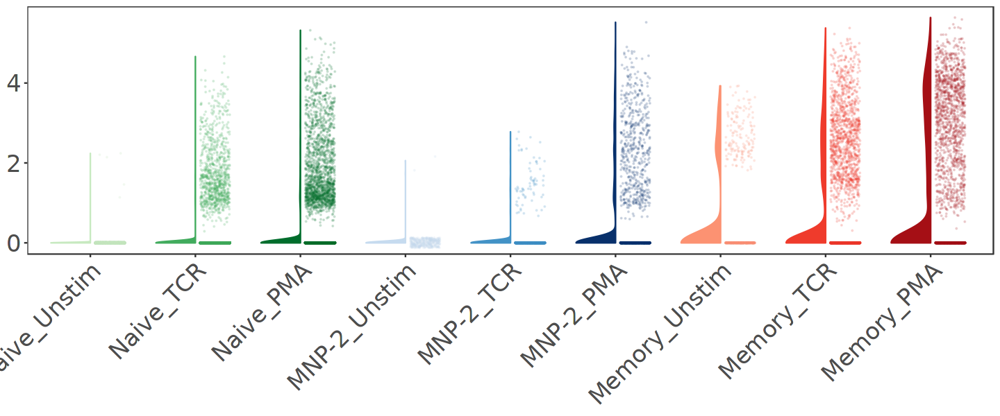

In [188]:
options(repr.plot.width = 12, repr.plot.height = 5)
marker_df %>% 
    mutate(celltype_stim = factor(celltype_stim, levels = c('Naive_Unstim','Naive_TCR','Naive_PMA','MNP-2_Unstim','MNP-2_TCR','MNP-2_PMA',
                                                            'Memory_Unstim','Memory_TCR','Memory_PMA'))) %>%
    ggplot(aes(x = celltype_stim, y = GZMB, fill=celltype_stim, color=celltype_stim)) + 
      geom_half_point(size = 0.1, alpha = 0.15) +
      geom_half_violin(scale = 'width') +
      scale_color_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      scale_fill_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      theme_bw() +
      theme(axis.text.x = element_text(size = 20, angle = 45, hjust = 1, vjust = 1),
            axis.title.x = element_blank(),
            axis.text.y = element_text(size = 20),
            axis.title.y = element_blank(),
            legend.position = 'none',
            panel.grid.major = element_blank(), 
            panel.grid.minor = element_blank())

In [189]:
# Open a pdf file
pdf("plots/stim_GZMB.pdf", width = 12, height = 5) 
# 2. Create a plot
marker_df %>% 
    mutate(celltype_stim = factor(celltype_stim, levels = c('Naive_Unstim','Naive_TCR','Naive_PMA','MNP-2_Unstim','MNP-2_TCR','MNP-2_PMA',
                                                            'Memory_Unstim','Memory_TCR','Memory_PMA'))) %>%
    ggplot(aes(x = celltype_stim, y = GZMB, fill=celltype_stim, color=celltype_stim)) + 
      geom_half_point(size = 0.1, alpha = 0.15) +
      geom_half_violin(scale = 'width') +
      scale_color_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      scale_fill_manual(values = c('#c7e9c0','#41ab5d','#006d2c',
                                    '#c6dbef','#4292c6','#08306b',
                                    '#fc9272','#ef3b2c','#a50f15')) +
      theme_bw() +
      theme(axis.text.x = element_text(size = 20, angle = 45, hjust = 1, vjust = 1),
            axis.title.x = element_blank(),
            axis.text.y = element_text(size = 20),
            axis.title.y = element_blank(),
            legend.position = 'none',
            panel.grid.major = element_blank(), 
            panel.grid.minor = element_blank())
# Close the pdf file
dev.off()

png 
  2

# Fig 8E

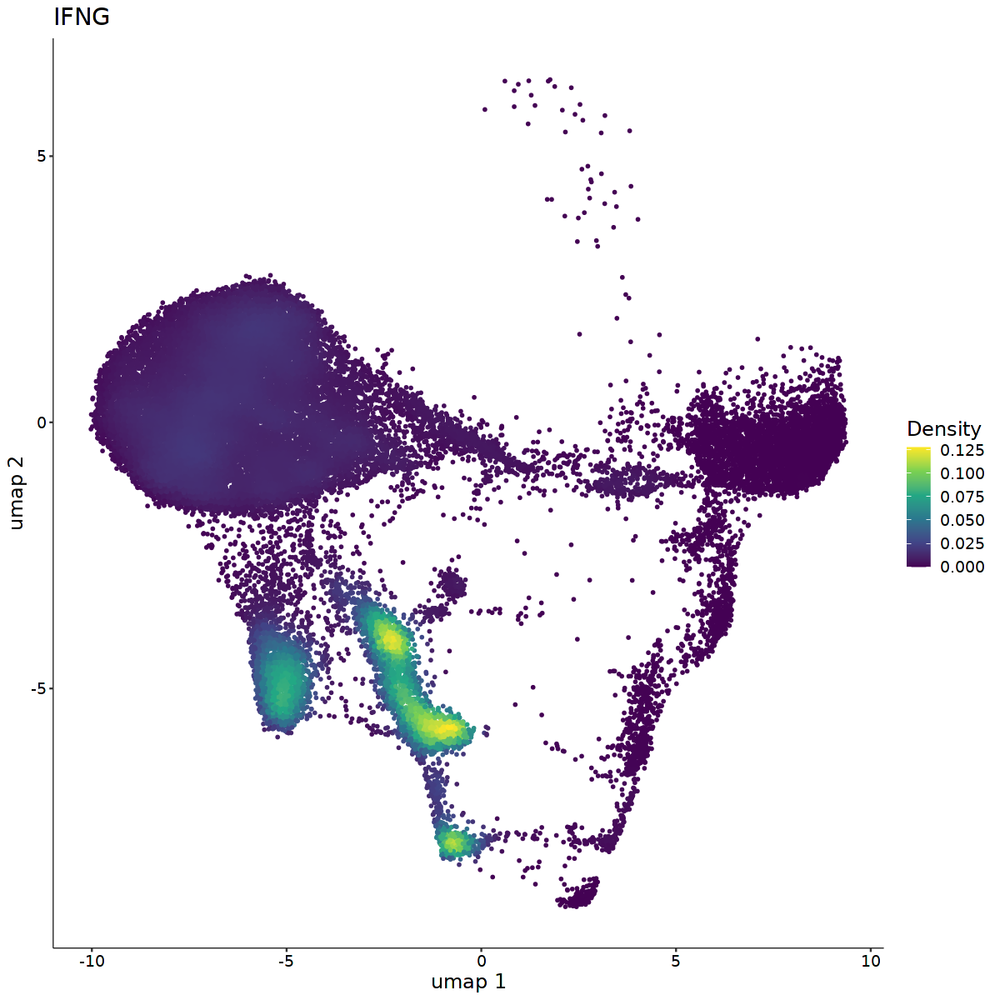

In [190]:
options(repr.plot.width = 10, repr.plot.height = 10)
plot_density(pma, features = 'IFNG')

In [191]:
# Open a pdf file
pdf("plots/pma_ifng_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
plot_density(pma, features = 'IFNG')
# Close the pdf file
dev.off()

png 
  2

In [192]:
options(repr.plot.width = 10, repr.plot.height = 10)
p1 <- plot_density(pma, features = c('IFNG','IL2','TNF'), joint = TRUE)

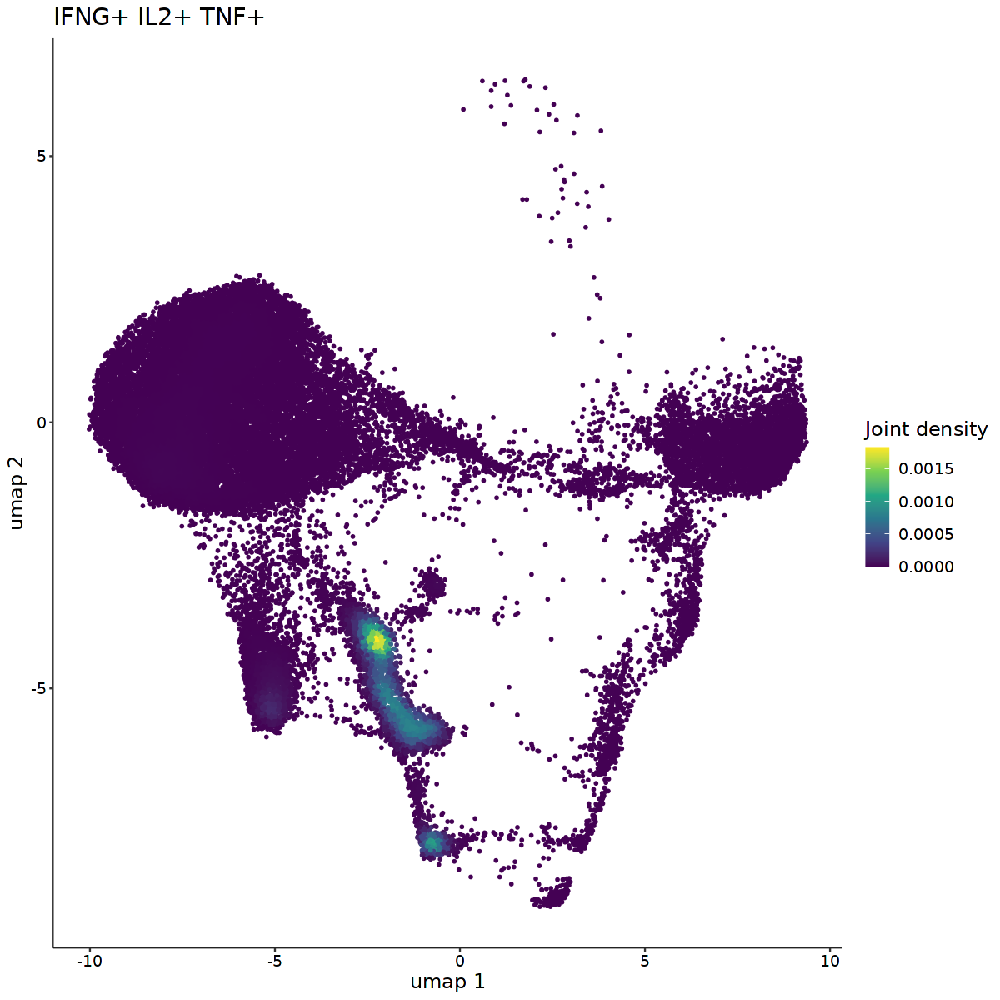

In [193]:
p1[[4]]

In [194]:
# Open a pdf file
pdf("plots/pma_ifng_il2_tnf_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
p1[[4]]
# Close the pdf file
dev.off()

png 
  2

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


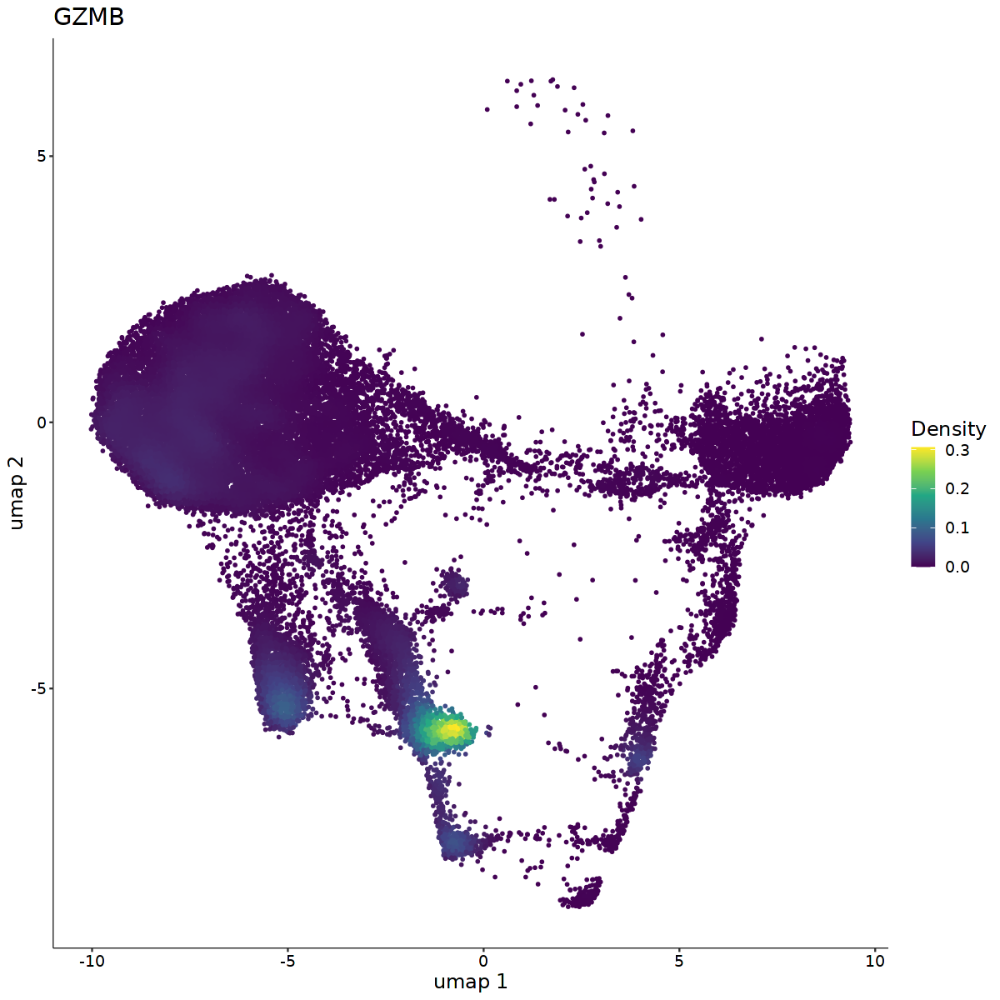

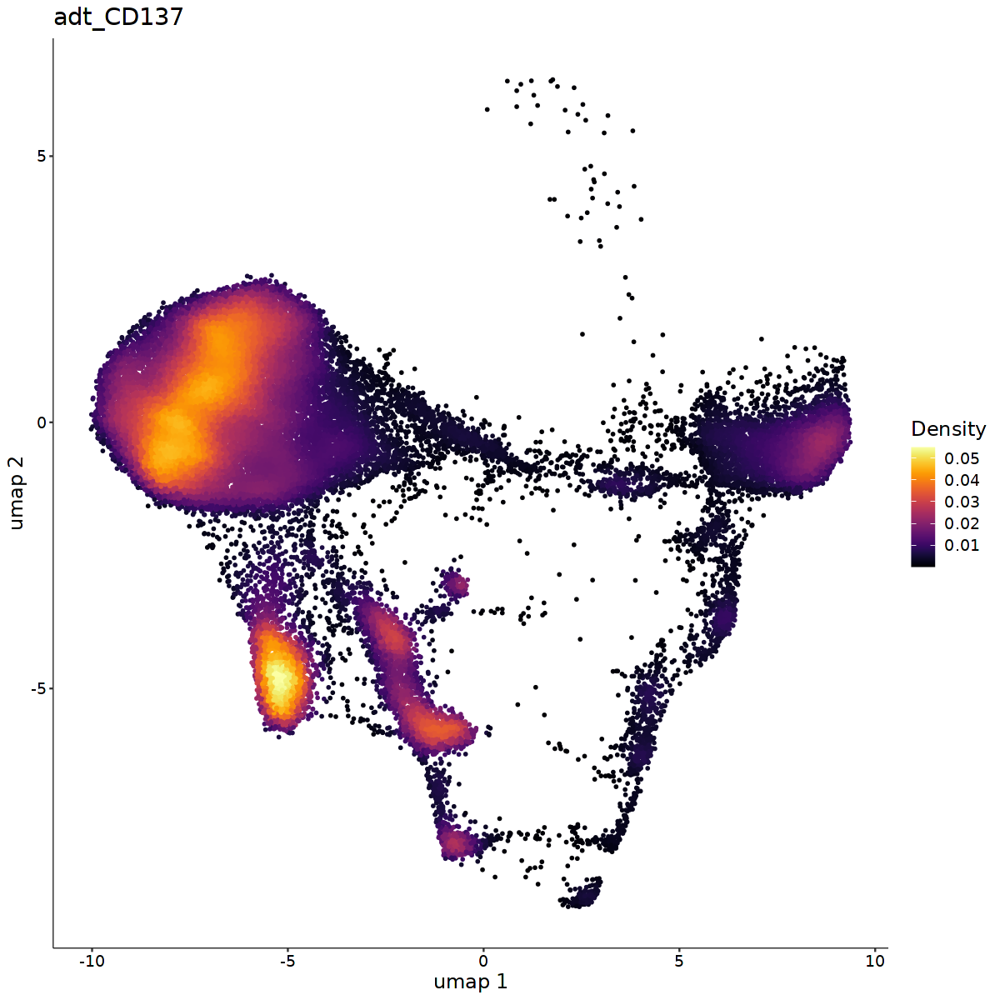

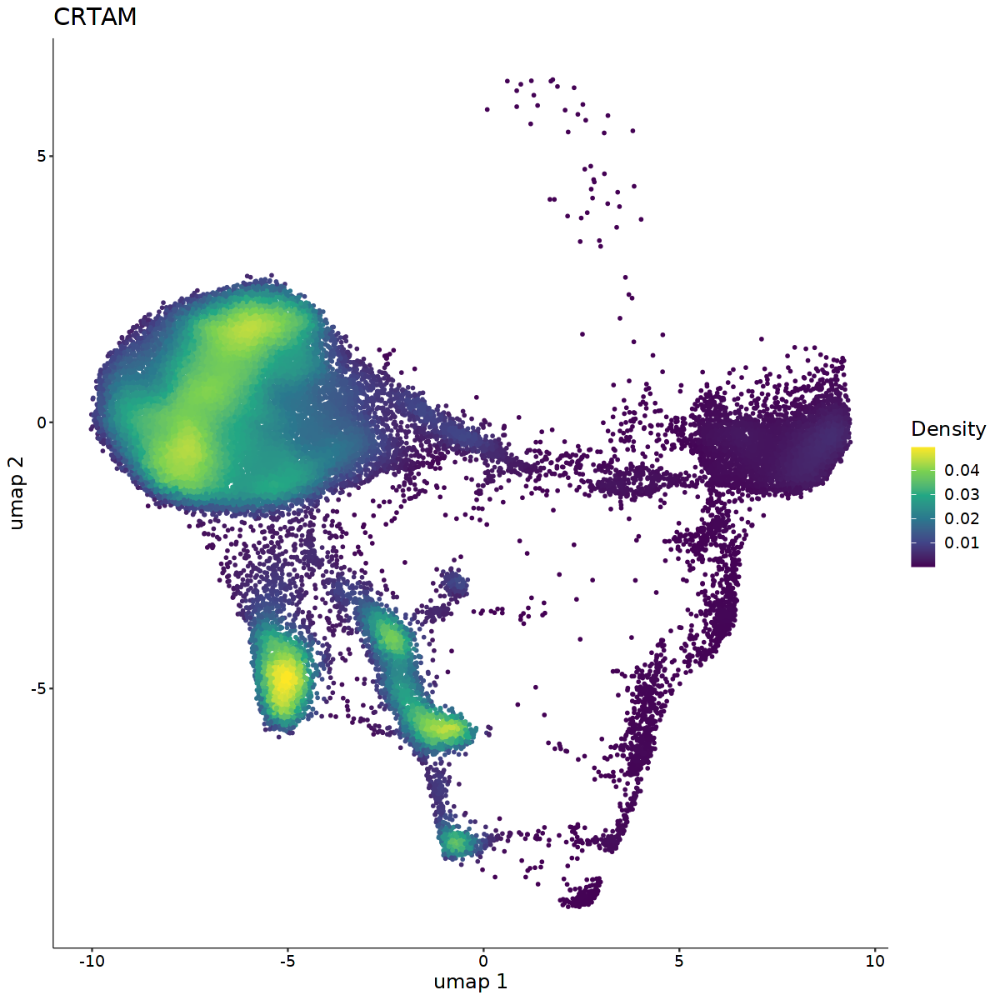

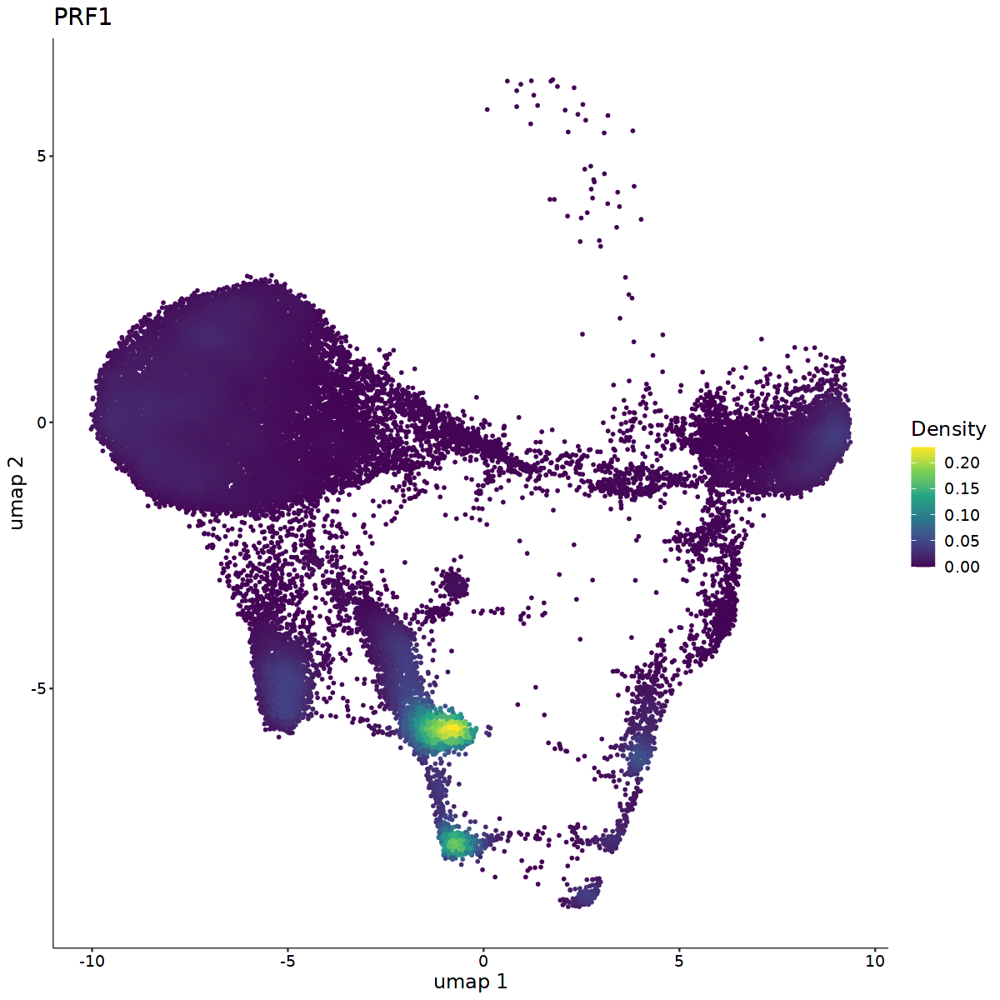

In [195]:
options(repr.plot.width = 10, repr.plot.height = 10)
plot_density(pma, features = 'GZMB')
plot_density(pma, features = 'CRTAM')

In [196]:
# Open a pdf file
pdf("plots/pma_gzmb_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
plot_density(pma, features = 'GZMB')
# Close the pdf file
dev.off()

png 
  2

In [ ]:
# Open a pdf file
pdf("plots/pma_crtam_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
plot_density(pma, features = 'CRTAM')
# Close the pdf file
dev.off()

In [334]:
pma <- SetIdent(pma, value = 'stim')
pma_only <- subset(pma, idents = 'PMA')

In [335]:
pma_only <- SetIdent(pma_only, value = 'cell.type')
pma_only_trim <- subset(pma_only, idents = c('Naive', 'MNP-2', 'Memory'))

In [336]:
table(pma_only_trim$sampleID)


UP1002 UP1003 UP1006 UP1010 
  7037   4895   7146   6857 

In [337]:
pma_only_trim$celltype_sampleID <- paste0(pma_only_trim$cell.type, '_', pma_only_trim$sampleID)

In [400]:
ifng_pma_exp <- AverageExpression(pma_only_trim, features = c('IFNG','CCL3','CCL4','CSF2','TNFRSF9','CRTAM','CCL5','SPRY2','TNF','GZMB'), assay = 'RNA', group.by = 'celltype_sampleID')

In [401]:
ifng_pma_exp <- as.data.frame(ifng_pma_exp$RNA)

In [402]:
head(ifng_pma_exp)
t_ifng_pma_exp <- as.data.frame(t(ifng_pma_exp))
head(t_ifng_pma_exp)

,Memory-UP1002,Memory-UP1003,Memory-UP1006,Memory-UP1010,MNP-2-UP1002,MNP-2-UP1003,MNP-2-UP1006,MNP-2-UP1010,Naive-UP1002,Naive-UP1003,Naive-UP1006,Naive-UP1010
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
IFNG,267.97870,234.624818,467.75800,156.52667,36.54190,54.69057,61.34055,24.22165,1.1004457,1.8676630,1.18939010,1.3486538
CCL3,34.34911,33.989781,72.48401,24.89557,11.32682,19.52264,18.91535,20.02062,0.1436407,0.2396739,0.08835952,0.2207692
CCL4,129.26746,118.188321,267.39917,87.28490,42.01117,69.10755,72.26181,63.88531,0.5850189,0.9652174,0.35073492,0.7613462
CSF2,32.98580,38.294891,48.15021,25.89671,32.39944,41.04528,28.77165,19.51546,0.5209119,0.5869565,0.63422875,0.5544231
TNFRSF9,10.29704,8.224818,10.43115,8.61294,13.27654,16.03962,15.75591,13.35438,4.5450806,3.6875000,3.74319986,2.6480769
CRTAM,18.13373,18.616058,25.84423,15.03632,25.68715,34.86415,34.85039,23.83763,6.8339047,9.3472826,10.66126035,6.7615385


,IFNG,CCL3,CCL4,CSF2,TNFRSF9,CRTAM,CCL5,SPRY2
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Memory-UP1002,267.97870,34.34911,129.26746,32.98580,10.297041,18.13373,11.158580,0.1479290
Memory-UP1003,234.62482,33.98978,118.18832,38.29489,8.224818,18.61606,10.570803,0.1810219
Memory-UP1006,467.75800,72.48401,267.39917,48.15021,10.431154,25.84423,14.764951,0.1126565
Memory-UP1010,156.52667,24.89557,87.28490,25.89671,8.612940,15.03632,10.334847,0.2837684
MNP-2-UP1002,36.54190,11.32682,42.01117,32.39944,13.276536,25.68715,4.977654,1.4776536
MNP-2-UP1003,54.69057,19.52264,69.10755,41.04528,16.039623,34.86415,6.196226,1.9735849


In [403]:
t_ifng_pma_exp$celltype <- c('Memory','Memory','Memory','Memory','MNP-2','MNP-2','MNP-2','MNP-2','Naive','Naive','Naive','Naive')
# colnames(t_ifng_pma_exp) <- c('IFNG','celltype')
head(t_ifng_pma_exp)

,IFNG,CCL3,CCL4,CSF2,TNFRSF9,CRTAM,CCL5,SPRY2,celltype
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>
Memory-UP1002,267.97870,34.34911,129.26746,32.98580,10.297041,18.13373,11.158580,0.1479290,Memory
Memory-UP1003,234.62482,33.98978,118.18832,38.29489,8.224818,18.61606,10.570803,0.1810219,Memory
Memory-UP1006,467.75800,72.48401,267.39917,48.15021,10.431154,25.84423,14.764951,0.1126565,Memory
Memory-UP1010,156.52667,24.89557,87.28490,25.89671,8.612940,15.03632,10.334847,0.2837684,Memory
MNP-2-UP1002,36.54190,11.32682,42.01117,32.39944,13.276536,25.68715,4.977654,1.4776536,MNP-2
MNP-2-UP1003,54.69057,19.52264,69.10755,41.04528,16.039623,34.86415,6.196226,1.9735849,MNP-2


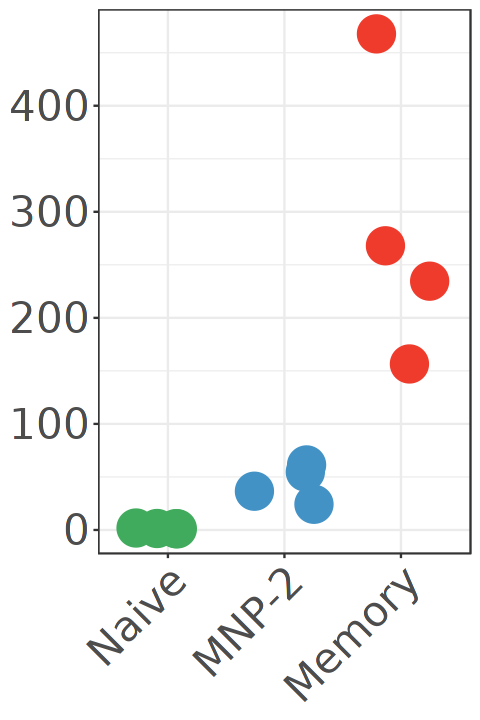

In [419]:
options(repr.plot.width = 4, repr.plot.height = 6)
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = IFNG, color = celltype)) + geom_jitter(size=10) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 25, angle = 45, vjust = 1, hjust = 1), 
              axis.text.y = element_text(size = 25),
              axis.title.x = element_blank(),
              axis.title.y = element_blank(),
              legend.position = 'none')

In [420]:
# Open a pdf file
pdf("plots/ifng_dot_pma.pdf", width = 4, height = 6) 
# 2. Create a plot
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = IFNG, color = celltype)) + geom_jitter(size=10) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 25, angle = 45, vjust = 1, hjust = 1), 
              axis.text.y = element_text(size = 25),
              axis.title.x = element_blank(),
              axis.title.y = element_blank(),
              legend.position = 'none')
# Close the pdf file
dev.off() 

png 
  2

In [367]:
# Open a pdf file
pdf("plots/PMA_CRTAM_avg_exp_plot.pdf", width = 2.5, height = 5) 
# 2. Create a plot
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = CRTAM, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')
# Close the pdf file
dev.off()

png 
  2

In [ ]:
# Open a pdf file
pdf("plots/PMA_GZMB_avg_exp_plot.pdf", width = 2.5, height = 5) 
# 2. Create a plot
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = GZMB, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')
# Close the pdf file
dev.off()

In [ ]:
# Open a pdf file
pdf("plots/PMA_TNF_avg_exp_plot.pdf", width = 2.5, height = 5) 
# 2. Create a plot
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = TNF, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')
# Close the pdf file
dev.off()

# Fig 8G

# Ext Fig 10A

In [113]:
table(pma_tcr$sampleID)
pma_tcr <- SetIdent(pma_tcr, value = 'sampleID')


Pooled Peds      UP1002      UP1003      UP1006      UP1010 
       5681       13001       13418       15078       16330 

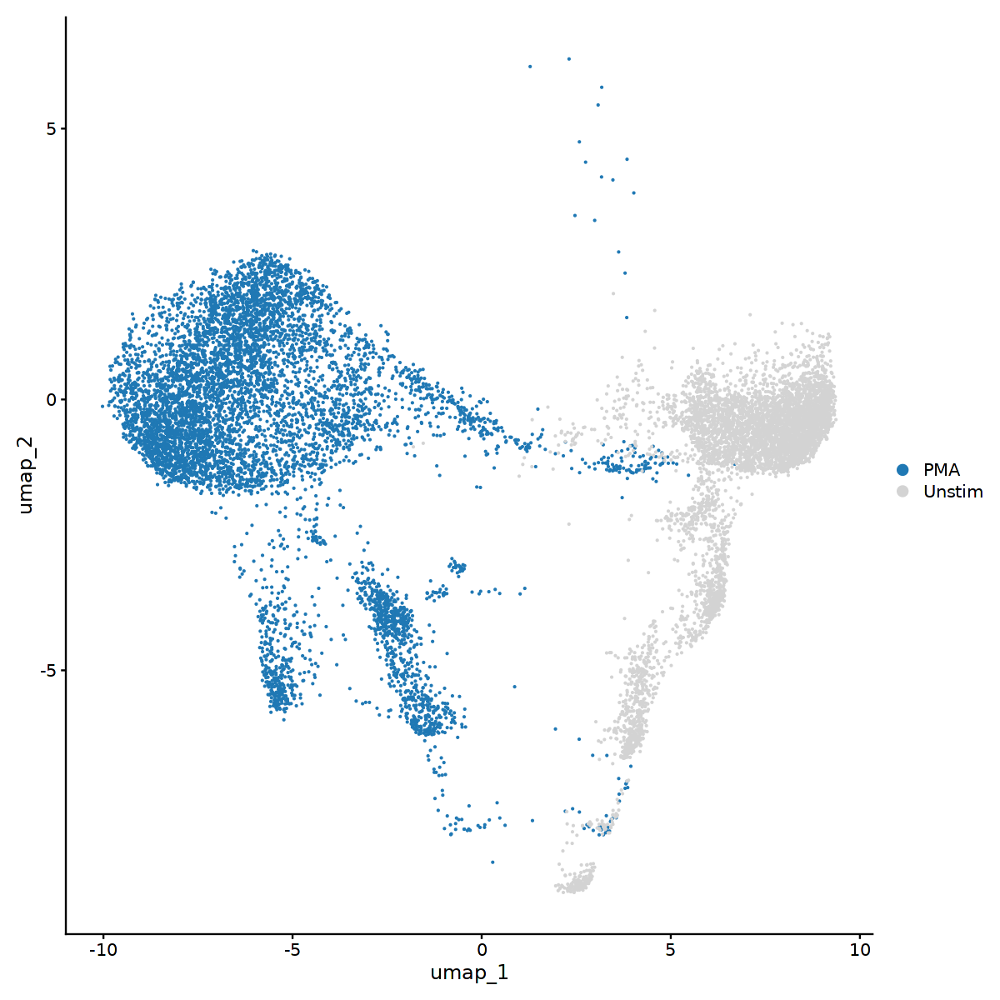

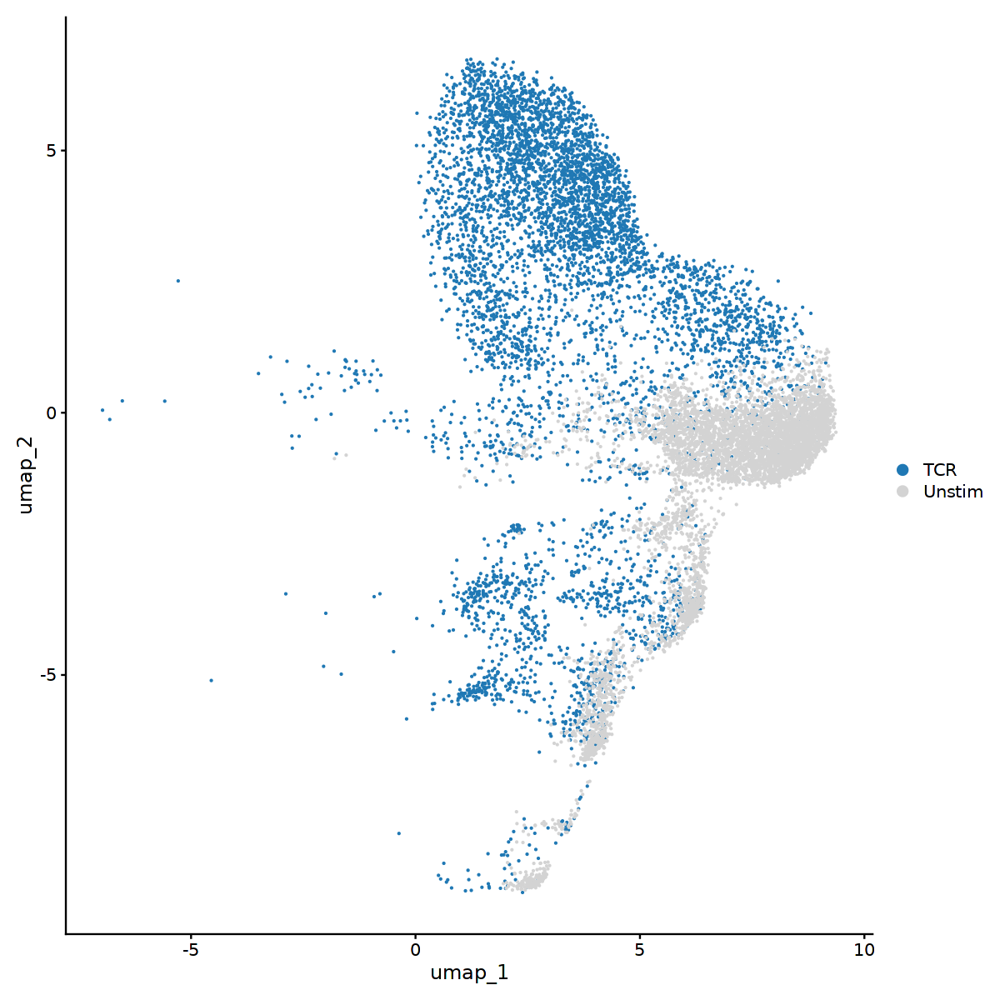

In [114]:
up1002 <- subset(pma_tcr, idents = c('Pooled Peds', 'UP1002'))
up1002 <- SetIdent(up1002, value = 'stim')
up1002_pma <- subset(up1002, idents = c('Unstim','PMA'))
up1002_tcr <- subset(up1002, idents = c('Unstim','TCR'))
DimPlot(up1002_pma, cols = c('#1f78b4','lightgrey'))
DimPlot(up1002_tcr, cols = c('#1f78b4','lightgrey'))

In [115]:
# Open a pdf file
pdf("plots/pma_up1002_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
DimPlot(up1002_pma, cols = c('#1f78b4','lightgrey')) & NoLegend()
# Close the pdf file
dev.off() 

png 
  2

In [116]:
# Open a pdf file
pdf("plots/tcr_up1002_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
DimPlot(up1002_tcr, cols = c('#1f78b4','lightgrey')) & NoLegend()
# Close the pdf file
dev.off() 

png 
  2

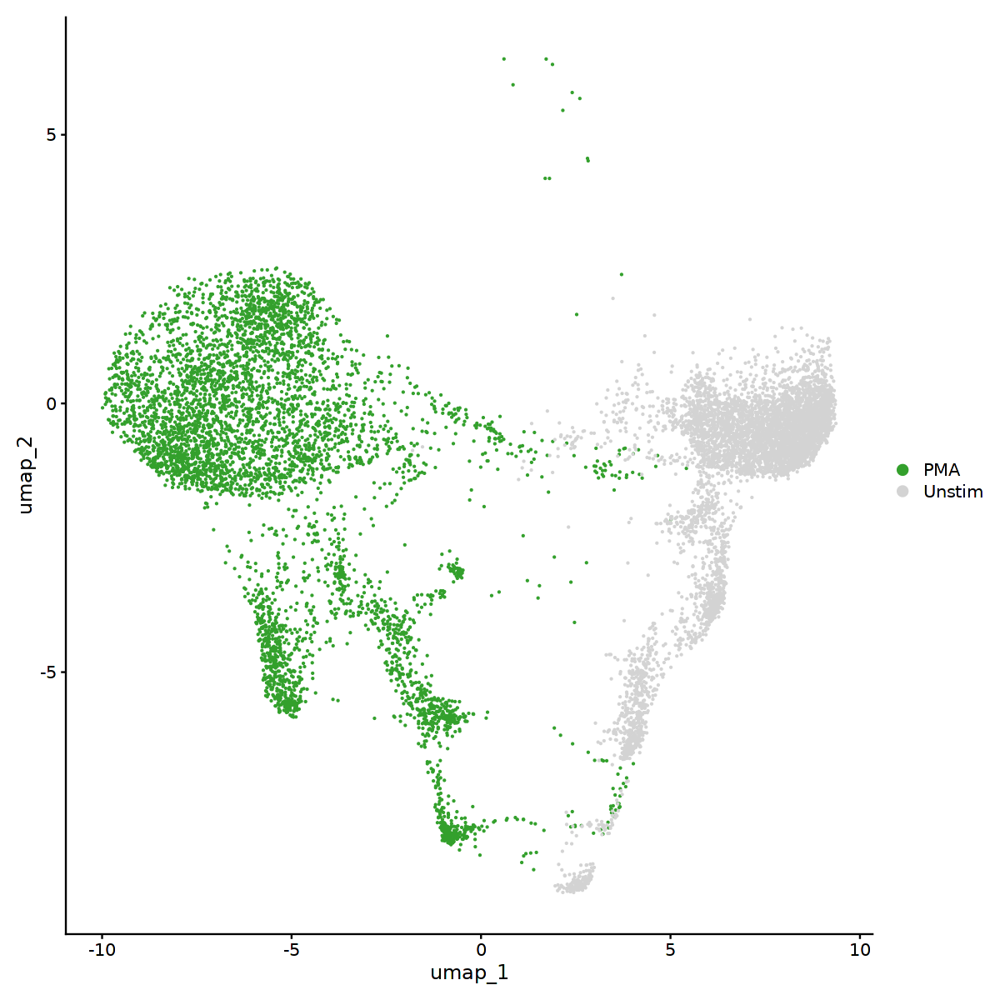

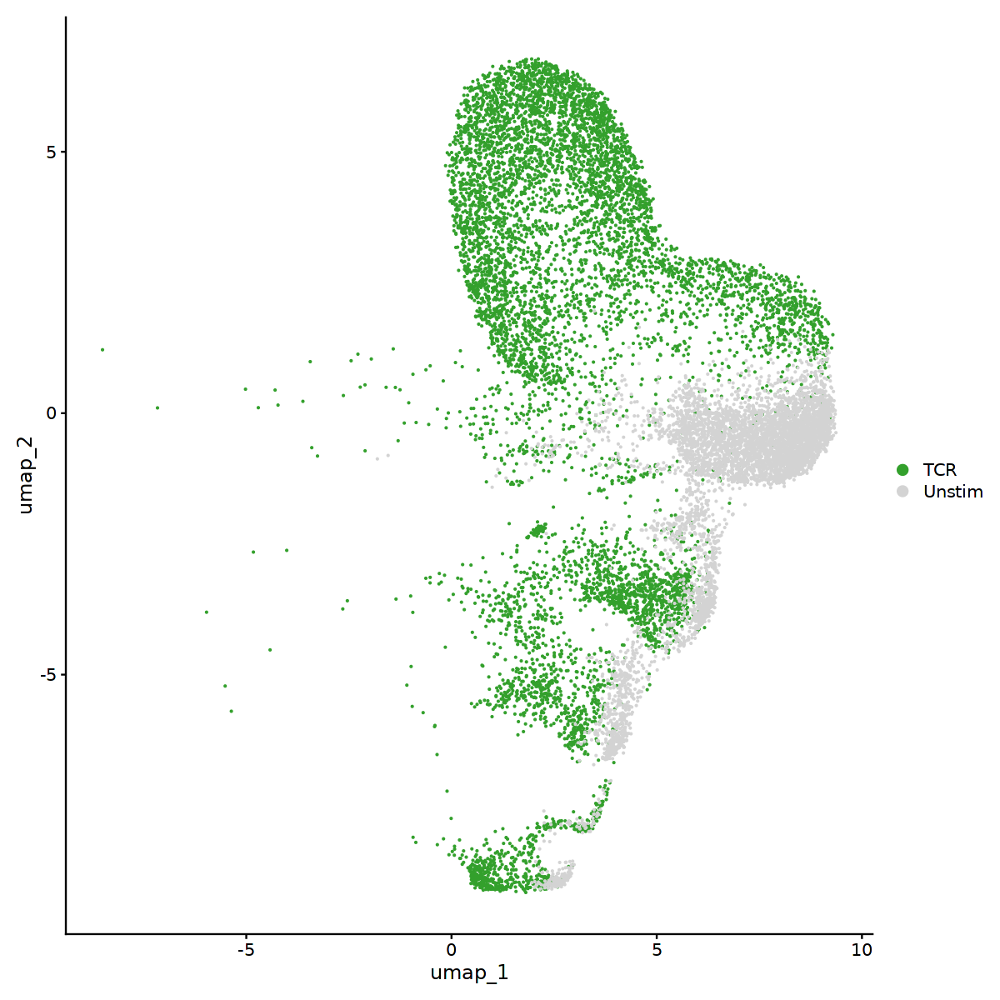

In [117]:
up1003 <- subset(pma_tcr, idents = c('Pooled Peds', 'UP1003'))
up1003 <- SetIdent(up1003, value = 'stim')
up1003_pma <- subset(up1003, idents = c('Unstim','PMA'))
up1003_tcr <- subset(up1003, idents = c('Unstim','TCR'))
DimPlot(up1003_pma, cols = c('#33a02c','lightgrey'))
DimPlot(up1003_tcr, cols = c('#33a02c','lightgrey'))

In [118]:
# Open a pdf file
pdf("plots/pma_up1003_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
DimPlot(up1003_pma, cols = c('#33a02c','lightgrey')) & NoLegend()
# Close the pdf file
dev.off() 

png 
  2

In [119]:
# Open a pdf file
pdf("plots/tcr_up1003_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
DimPlot(up1003_tcr, cols = c('#33a02c','lightgrey')) & NoLegend()
# Close the pdf file
dev.off() 

png 
  2

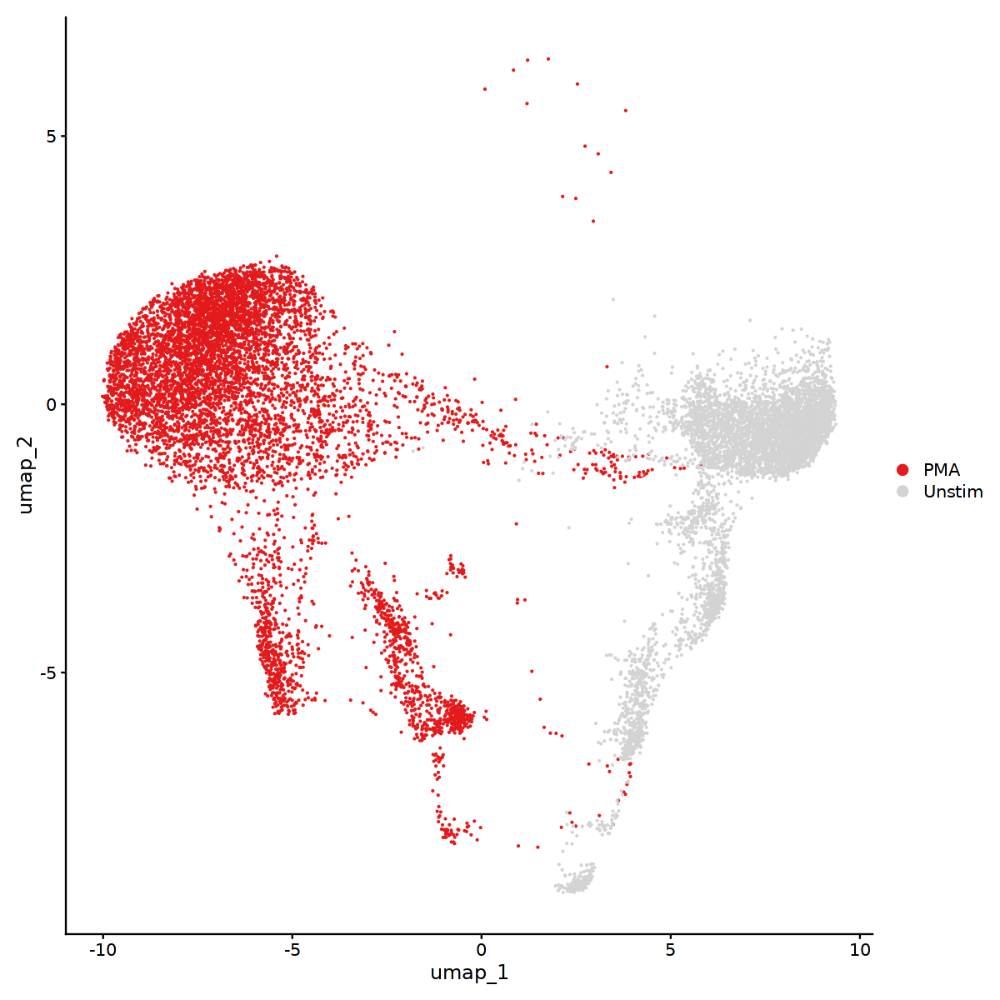

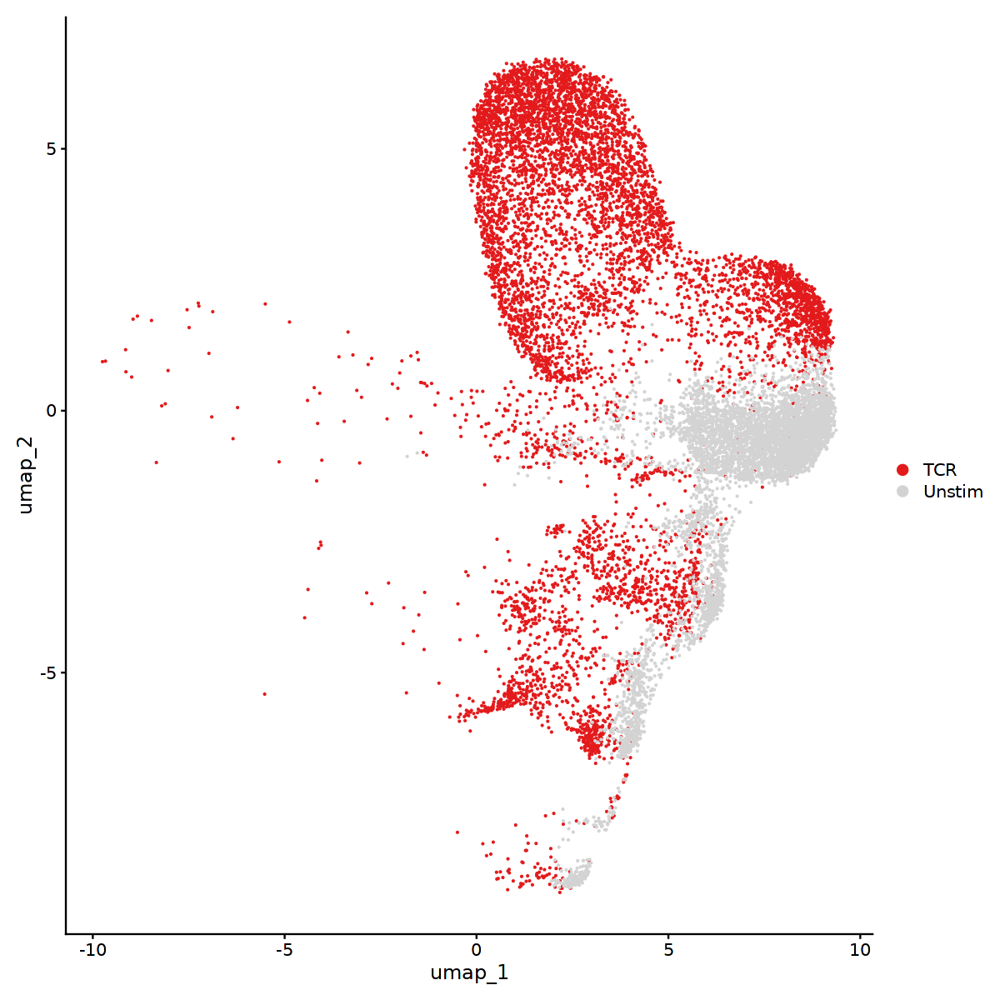

In [120]:
up1006 <- subset(pma_tcr, idents = c('Pooled Peds', 'UP1006'))
up1006 <- SetIdent(up1006, value = 'stim')
up1006_pma <- subset(up1006, idents = c('Unstim','PMA'))
up1006_tcr <- subset(up1006, idents = c('Unstim','TCR'))
DimPlot(up1006_pma, cols = c('#e31a1c','lightgrey'))
DimPlot(up1006_tcr, cols = c('#e31a1c','lightgrey'))

In [121]:
# Open a pdf file
pdf("plots/pma_up1006_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
DimPlot(up1006_pma, cols = c('#e31a1c','lightgrey')) & NoLegend()
# Close the pdf file
dev.off() 

png 
  2

In [122]:
# Open a pdf file
pdf("plots/tcr_up1006_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
DimPlot(up1006_tcr, cols = c('#e31a1c','lightgrey')) & NoLegend()
# Close the pdf file
dev.off() 

png 
  2

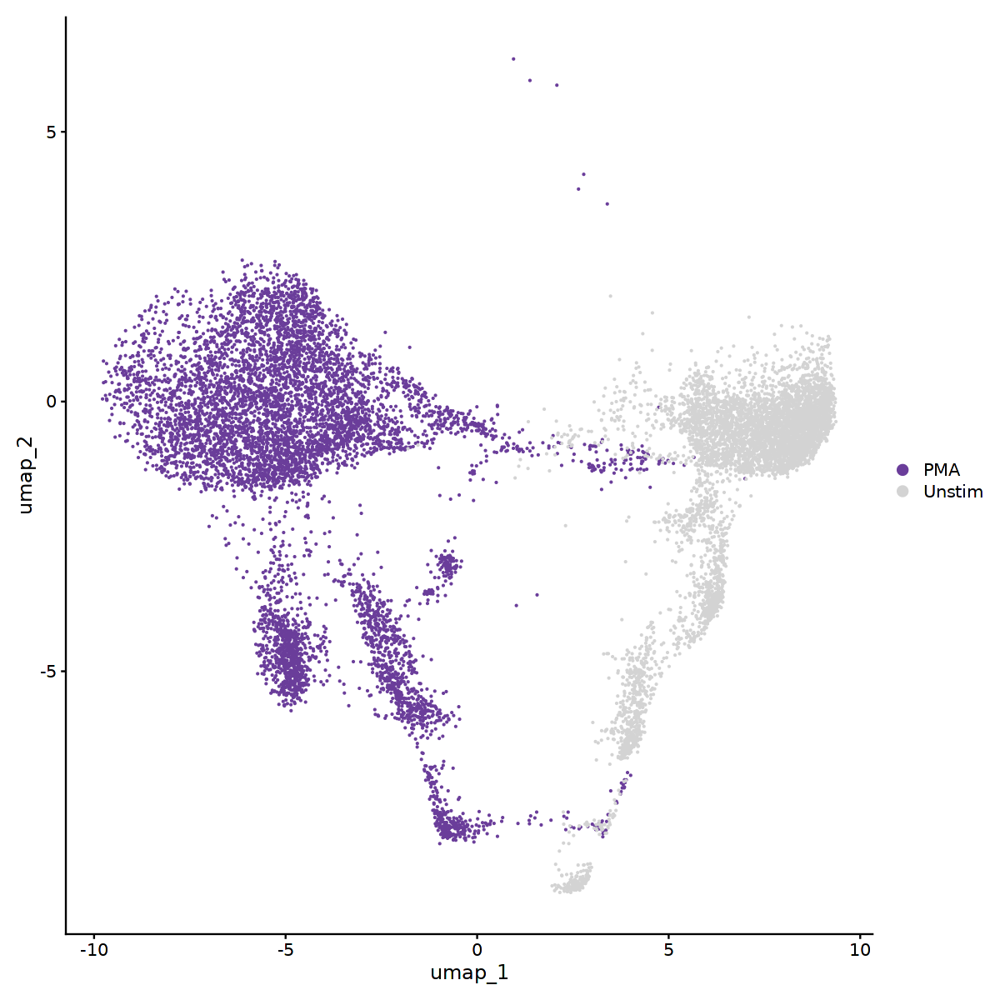

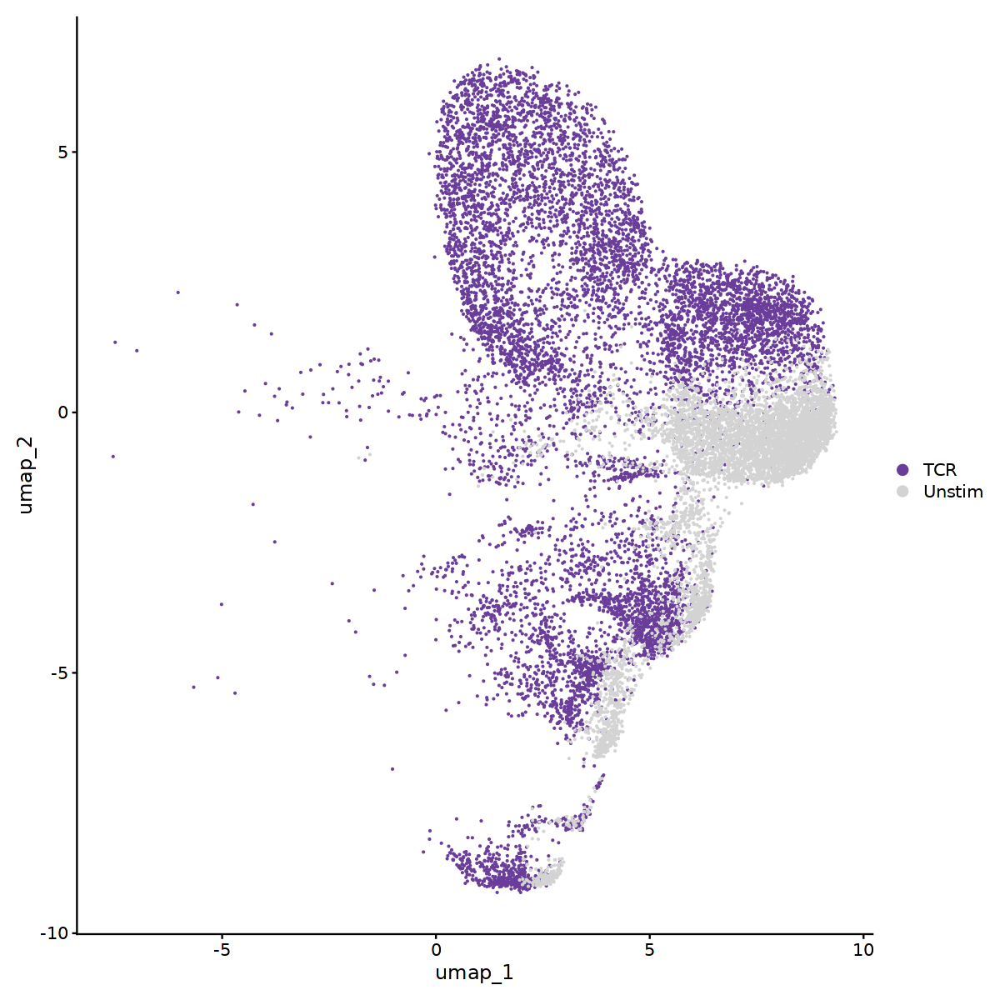

In [123]:
up1010 <- subset(pma_tcr, idents = c('Pooled Peds', 'UP1010'))
up1010 <- SetIdent(up1010, value = 'stim')
up1010_pma <- subset(up1010, idents = c('Unstim','PMA'))
up1010_tcr <- subset(up1010, idents = c('Unstim','TCR'))
DimPlot(up1010_pma, cols = c('#6a3d9a','lightgrey'))
DimPlot(up1010_tcr, cols = c('#6a3d9a','lightgrey'))

In [124]:
# Open a pdf file
pdf("plots/pma_up1010_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
DimPlot(up1010_pma, cols = c('#6a3d9a','lightgrey')) & NoLegend()
# Close the pdf file
dev.off() 

png 
  2

In [125]:
# Open a pdf file
pdf("plots/tcr_up1010_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
DimPlot(up1010_tcr, cols = c('#6a3d9a','lightgrey')) & NoLegend()
# Close the pdf file
dev.off() 

png 
  2

# Ext Fig 10B

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


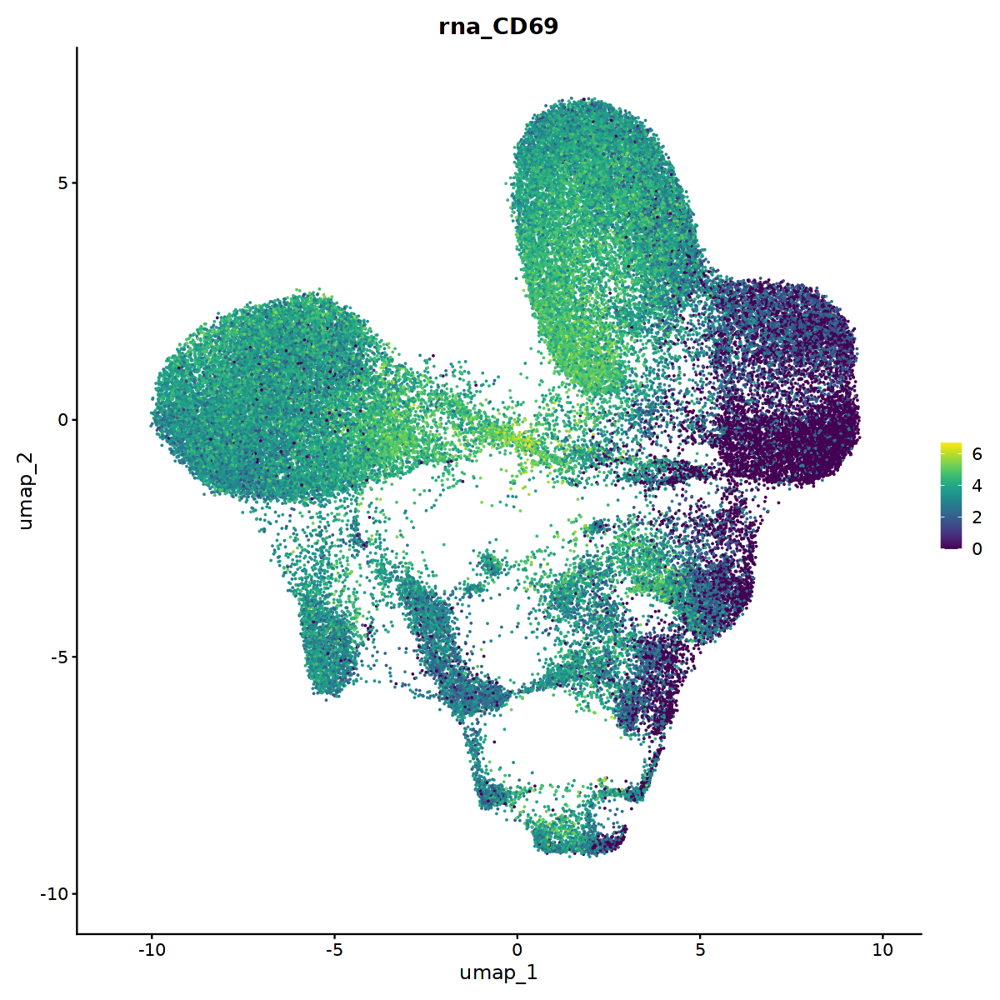

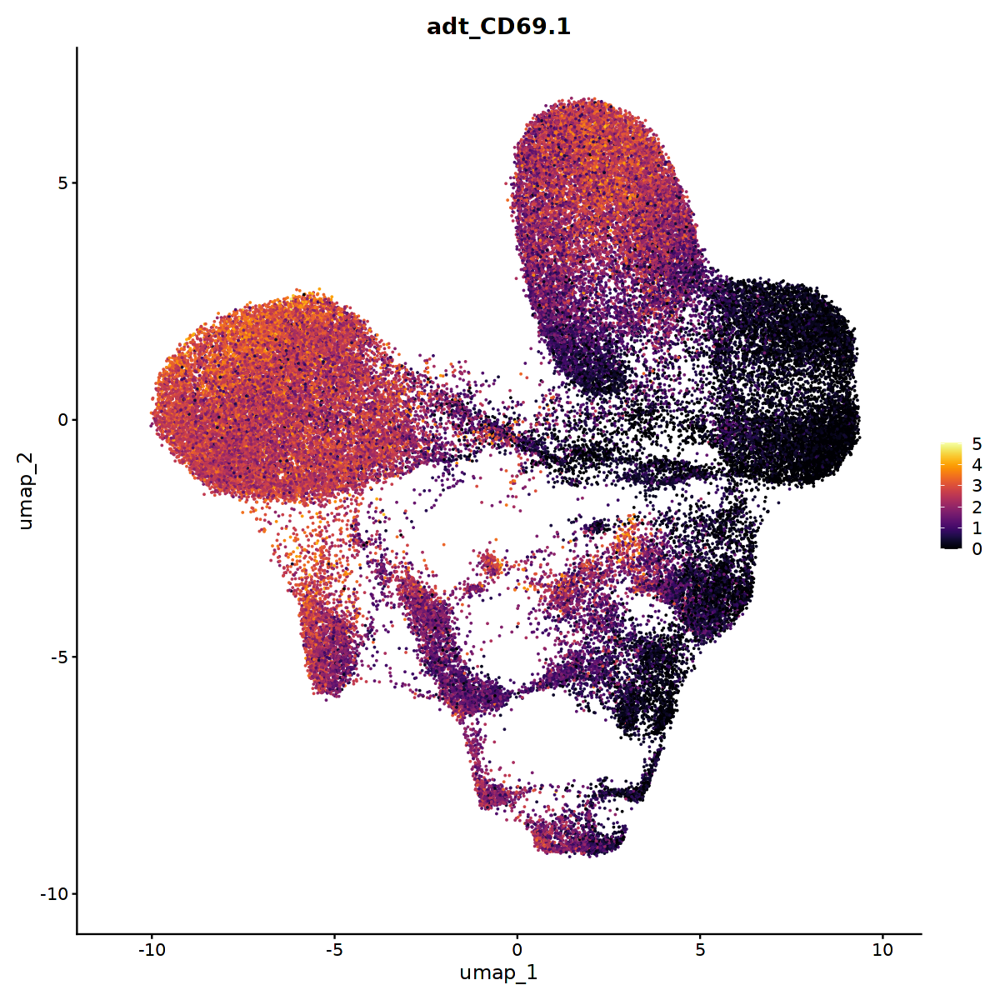

In [97]:
options(repr.plot.width = 10, repr.plot.height = 10)
FeaturePlot(pma_tcr, features = 'rna_CD69') & scale_color_viridis()
FeaturePlot(pma_tcr, features = 'adt_CD69.1') & scale_colour_viridis(option = 'inferno')

In [126]:
# Open a pdf file
pdf("plots/pma_tcr_umap_CD69_RNA.pdf", width = 10, height = 10) 
# 2. Create a plot
FeaturePlot(pma_tcr, features = 'rna_CD69') & scale_color_viridis()
# Close the pdf file
dev.off() 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

In [127]:
# Open a pdf file
pdf("plots/pma_tcr_umap_CD69_ADT.pdf", width = 10, height = 10) 
# 2. Create a plot
FeaturePlot(pma_tcr, features = 'adt_CD69.1') & scale_colour_viridis(option = 'inferno')
# Close the pdf file
dev.off() 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

# Ext Fig 10C

In [134]:
library(fgsea)
# Read GMT file in as list of gene sets
# Based on code form GSEABase
readGMT <- function(fp, sep = "\t", ...){
    assertthat::assert_that(file.exists(fp), 
                           msg = sprintf("Could not locate input file %s", fp))
    assertthat::assert_that(grepl(".gmt$", fp),
                            msg = sprintf("Expecting file extension '.gmt'. Input file: %s", fp))
    
    lines <- strsplit(readLines(fp, ...), sep)
    gene_list <- lapply(lines, function(line) {
        unlist(line[-(1:2)])
    })
    names(gene_list) <- sapply(lines, "[[",1)
    gene_list                    
}

In [135]:
# read in all gene sets and merge into one master list
kegg_fp <- "c2.cp.kegg.v7.5.1.symbols.gmt"
kegg_gs <- readGMT(kegg_fp)
hallmark_fp <- "h.all.v7.5.1.symbols.gmt"
hallmark_gs <- readGMT(hallmark_fp)
reactome_fp <- "c2.cp.reactome.v7.5.1.symbols.gmt"
reactome_gs <- readGMT(reactome_fp) 

all_gs <- do.call("c", list(hallmark_gs, kegg_gs, reactome_gs))
length(all_gs)

[1] 1851

In [136]:
rank_genes_func <- function(x){
        gene_list <- -log10(x$p_val_adj)*sign(x$avg_log2FC)
        names(gene_list) <- rownames(x)
        sorted_gene_list <- sort(gene_list)
        sorted_gene_list <- replace(sorted_gene_list, sorted_gene_list=='-Inf',-500)
        sorted_gene_list <- replace(sorted_gene_list, sorted_gene_list=='Inf',500)
        return(sorted_gene_list)
        }

## Naive

In [137]:
ranked_genes <- rank_genes_func(deg_list$Naive)

In [138]:
naive_fgsea_res <- fgsea(pathways=all_gs,
                       stats=ranked_genes,
                       eps=0.0,
                       nPermSimple=10000)

Warning message in preparePathwaysAndStats(pathways, stats, minSize, maxSize, gseaParam, :
“There are ties in the preranked stats (9.1% of the list).
The order of those tied genes will be arbitrary, which may produce unexpected results.”
Warning message in fgseaMultilevel(pathways = pathways, stats = stats, minSize = minSize, :
“There were 1 pathways for which P-values were not calculated properly due to unbalanced (positive and negative) gene-level statistic values. For such pathways pval, padj, NES, log2err are set to NA. You can try to increase the value of the argument nPermSimple (for example set it nPermSimple = 100000)”


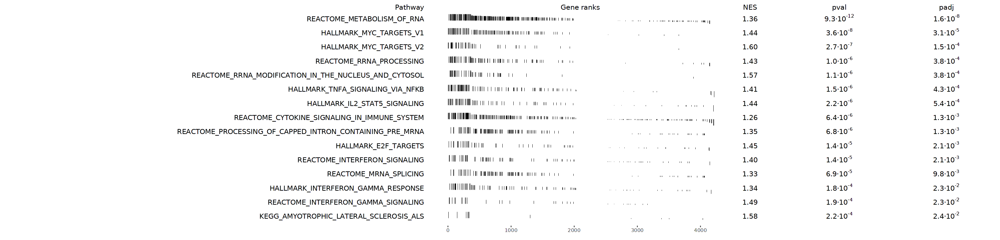

In [139]:
options(repr.plot.width = 25, repr.plot.height = 6)
topPathwaysUp <- naive_fgsea_res[ES > 0 & padj < 0.1][head(order(pval), n=15), pathway]
topPathwaysDown <- naive_fgsea_res[ES < 0 & padj < 0.1][head(order(pval), n=15), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(all_gs[topPathways], ranked_genes, naive_fgsea_res, 
              gseaParam=0.5)

## MNP-2

In [140]:
ranked_genes <- rank_genes_func(deg_list$`MNP-2`)

In [141]:
mnp2_fgsea_res <- fgsea(pathways=all_gs,
                       stats=ranked_genes,
                       eps=0.0,
                       nPermSimple=10000)

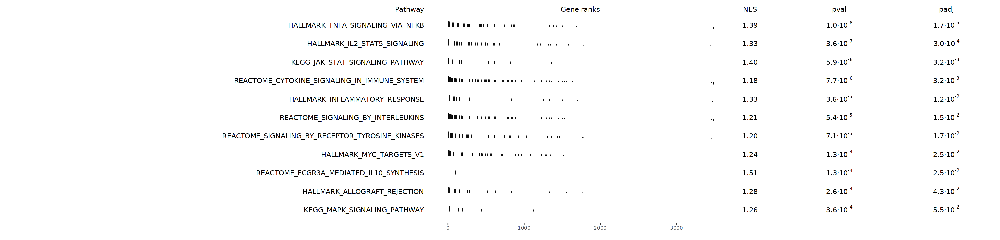

In [142]:
options(repr.plot.width = 25, repr.plot.height = 6)
topPathwaysUp <- mnp2_fgsea_res[ES > 0 & padj < 0.1][head(order(pval), n=15), pathway]
topPathwaysDown <- mnp2_fgsea_res[ES < 0 & padj < 0.1][head(order(pval), n=15), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(all_gs[topPathways], ranked_genes, mnp2_fgsea_res, 
              gseaParam=0.5)

## Memory

In [143]:
ranked_genes <- rank_genes_func(deg_list$Memory)

In [144]:
memory_fgsea_res <- fgsea(pathways=all_gs,
                       stats=ranked_genes,
                       eps=0.0,
                       nPermSimple=10000)

Warning message in fgseaMultilevel(pathways = pathways, stats = stats, minSize = minSize, :
“There were 1 pathways for which P-values were not calculated properly due to unbalanced (positive and negative) gene-level statistic values. For such pathways pval, padj, NES, log2err are set to NA. You can try to increase the value of the argument nPermSimple (for example set it nPermSimple = 100000)”


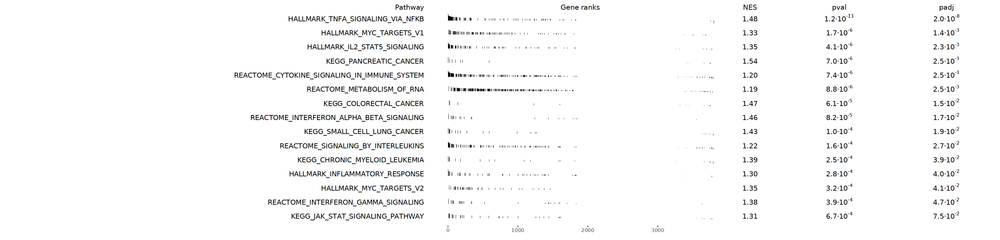

In [145]:
options(repr.plot.width = 25, repr.plot.height = 6)
topPathwaysUp <- memory_fgsea_res[ES > 0 & padj < 0.1][head(order(pval), n=15), pathway]
topPathwaysDown <- memory_fgsea_res[ES < 0 & padj < 0.1][head(order(pval), n=15), pathway]
topPathways <- c(topPathwaysUp, rev(topPathwaysDown))
plotGseaTable(all_gs[topPathways], ranked_genes, memory_fgsea_res, 
              gseaParam=0.5)

In [146]:
mem_subset <- subset(memory_fgsea_res, pathway %in% c('HALLMARK_TNFA_SIGNALING_VIA_NFKB',
                                                      'HALLMARK_MYC_TARGETS_V1',
                                                      'REACTOME_CYTOKINE_SIGNALING_IN_IMMUNE_SYSTEM',
                                                      'REACTOME_METABOLISM_OF_RNA',
                                                      'REACTOME_SIGNALING_BY_INTERLEUKINS',
                                                      'HALLMARK_INFLAMMATORY_RESPONSE'))

In [147]:
naive_subset <- subset(naive_fgsea_res, pathway %in% c('HALLMARK_TNFA_SIGNALING_VIA_NFKB',
                                                      'HALLMARK_MYC_TARGETS_V1',
                                                      'REACTOME_CYTOKINE_SIGNALING_IN_IMMUNE_SYSTEM',
                                                      'REACTOME_METABOLISM_OF_RNA',
                                                      'REACTOME_SIGNALING_BY_INTERLEUKINS',
                                                      'HALLMARK_INFLAMMATORY_RESPONSE'))
mnp2_subset <- subset(mnp2_fgsea_res, pathway %in% c('HALLMARK_TNFA_SIGNALING_VIA_NFKB',
                                                      'HALLMARK_MYC_TARGETS_V1',
                                                      'REACTOME_CYTOKINE_SIGNALING_IN_IMMUNE_SYSTEM',
                                                      'REACTOME_METABOLISM_OF_RNA',
                                                      'REACTOME_SIGNALING_BY_INTERLEUKINS',
                                                      'HALLMARK_INFLAMMATORY_RESPONSE'))

In [148]:
mem_subset$cell.type <- 'Memory'
naive_subset$cell.type <- 'Naive'
mnp2_subset$cell.type <- 'MNP-2'

In [149]:
combined_fgsea <- rbind(mem_subset, naive_subset, mnp2_subset)

## Pathway Plot

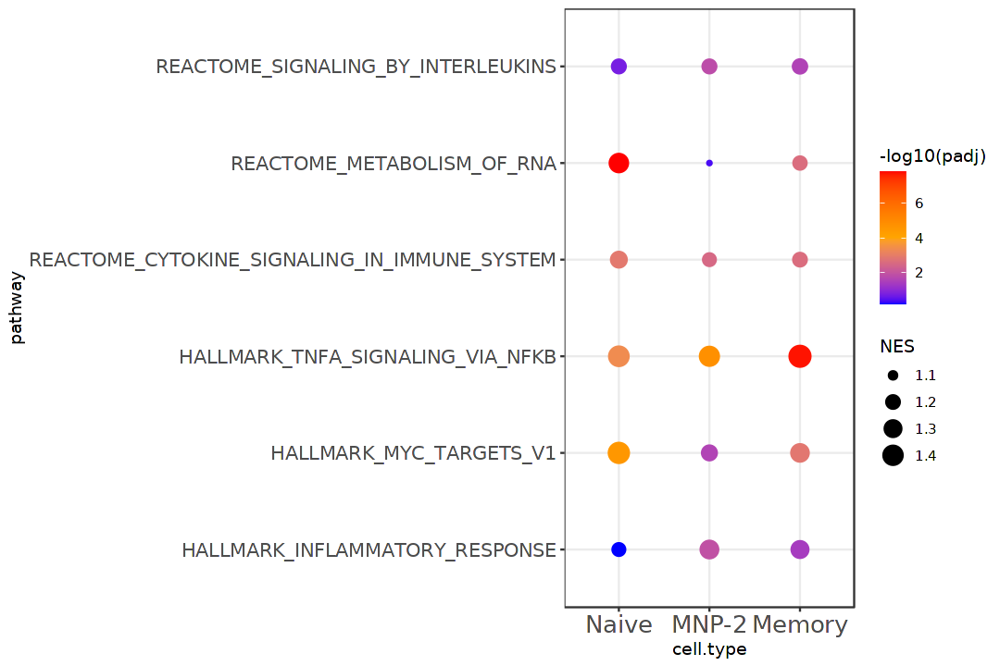

In [167]:
options(repr.plot.width = 9, repr.plot.height = 6)
combined_fgsea %>% 
    mutate(cell.type = factor(cell.type, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = cell.type, y = pathway)) + geom_point(aes(size = NES, color = -log10(padj))) + scale_color_gradient2(low = 'blue', mid = 'orange', high = 'red', midpoint = 4) + 
        theme_bw() +
        theme(axis.text.x = element_text(size = 15),
              axis.text.y = element_text(size = 12))

In [168]:
# Open a pdf file
pdf("plots/tcr_pathways.pdf", width = 9, height = 6) 
# 2. Create a plot
combined_fgsea %>% 
    mutate(cell.type = factor(cell.type, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = cell.type, y = pathway)) + geom_point(aes(size = NES, color = -log10(padj))) + scale_color_gradient2(low = 'blue', mid = 'orange', high = 'red', midpoint = 4) + 
        theme_bw() +
        theme(axis.text.x = element_text(size = 15),
              axis.text.y = element_text(size = 12))
# Close the pdf file
dev.off() 

png 
  2

# Ext Fig 10D

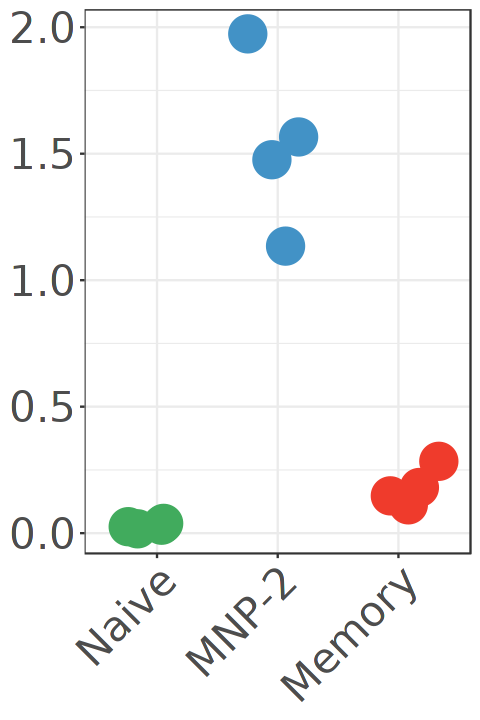

In [421]:
options(repr.plot.width = 4, repr.plot.height = 6)
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = SPRY2, color = celltype)) + geom_jitter(size=10) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 25, angle = 45, vjust = 1, hjust = 1), 
              axis.text.y = element_text(size = 25),
              axis.title.x = element_blank(),
              axis.title.y = element_blank(),
              legend.position = 'none')

In [422]:
# Open a pdf file
pdf("plots/spry2_dot_pma.pdf", width = 4, height = 6) 
# 2. Create a plot
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = SPRY2, color = celltype)) + geom_jitter(size=10) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 25, angle = 45, vjust = 1, hjust = 1), 
              axis.text.y = element_text(size = 25),
              axis.title.x = element_blank(),
              axis.title.y = element_blank(),
              legend.position = 'none')
# Close the pdf file
dev.off() 

png 
  2

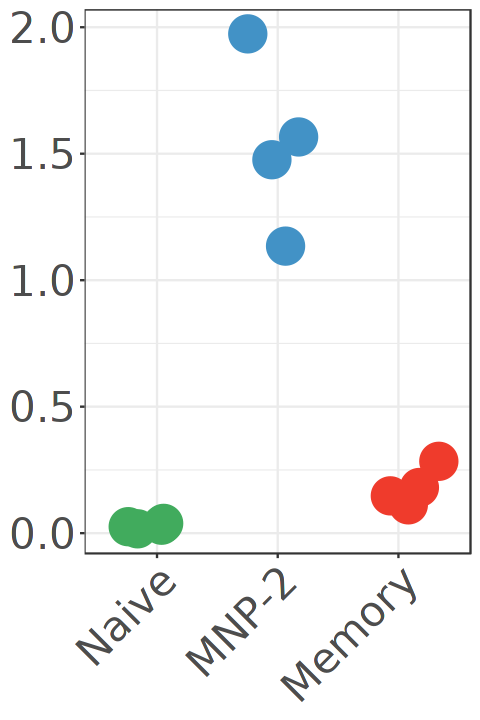

In [421]:
options(repr.plot.width = 4, repr.plot.height = 6)
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = IFNG, color = celltype)) + geom_jitter(size=10) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 25, angle = 45, vjust = 1, hjust = 1), 
              axis.text.y = element_text(size = 25),
              axis.title.x = element_blank(),
              axis.title.y = element_blank(),
              legend.position = 'none')

In [422]:
# Open a pdf file
pdf("plots/ifng_dot_pma.pdf", width = 4, height = 6) 
# 2. Create a plot
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = IFNG, color = celltype)) + geom_jitter(size=10) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 25, angle = 45, vjust = 1, hjust = 1), 
              axis.text.y = element_text(size = 25),
              axis.title.x = element_blank(),
              axis.title.y = element_blank(),
              legend.position = 'none')
# Close the pdf file
dev.off() 

png 
  2

In [209]:
tcr <- SetIdent(tcr, value = 'stim')
tcr_only <- subset(tcr, idents = 'TCR')
tcr_only <- SetIdent(tcr_only, value = 'cell.type')
tcr_only_trim <- subset(tcr_only, idents = c('Naive', 'MNP-2', 'Memory'))

In [210]:
table(tcr_only_trim$sampleID)


UP1002 UP1003 UP1006 UP1010 
  5668   7400   7560   8260 

In [211]:
tcr_only_trim$celltype_sampleID <- paste0(tcr_only_trim$cell.type, '_', tcr_only_trim$sampleID)

In [423]:
ifng_tcr_exp <- AverageExpression(tcr_only_trim, features = c('IFNG','SPRY2','CD109'), assay = 'RNA', group.by = 'celltype_sampleID')

In [424]:
ifng_tcr_exp <- as.data.frame(ifng_tcr_exp$RNA)

In [425]:
head(ifng_tcr_exp)
t_ifng_tcr_exp <- as.data.frame(t(ifng_tcr_exp))
head(t_ifng_tcr_exp)

,Memory-UP1002,Memory-UP1003,Memory-UP1006,Memory-UP1010,MNP-2-UP1002,MNP-2-UP1003,MNP-2-UP1006,MNP-2-UP1010,Naive-UP1002,Naive-UP1003,Naive-UP1006,Naive-UP1010
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
IFNG,5.87570621,9.58473625,32.84667418,8.01521934,0.08080808,0.4357683,0.8466819,0.2962515,0.048929021,0.211198600,0.282232200,0.11177961
SPRY2,0.05084746,0.08641975,0.06651635,0.11459266,0.50505051,0.6460957,0.5125858,0.7073761,0.001049979,0.007874016,0.003527903,0.01029132
CD109,0.04096045,0.16947250,0.31567080,0.09221128,0.17171717,0.3513854,0.2974828,0.3409915,0.076018480,0.245494313,0.318794099,0.10164661


,IFNG,SPRY2,CD109
,<dbl>,<dbl>,<dbl>
Memory-UP1002,5.87570621,0.05084746,0.04096045
Memory-UP1003,9.58473625,0.08641975,0.16947250
Memory-UP1006,32.84667418,0.06651635,0.31567080
Memory-UP1010,8.01521934,0.11459266,0.09221128
MNP-2-UP1002,0.08080808,0.50505051,0.17171717
MNP-2-UP1003,0.43576826,0.64609572,0.35138539


In [426]:
t_ifng_tcr_exp$celltype <- c('Memory','Memory','Memory','Memory','MNP-2','MNP-2','MNP-2','MNP-2','Naive','Naive','Naive','Naive')
# colnames(t_ifng_tcr_exp) <- c('IFNG','celltype')
head(t_ifng_tcr_exp)

,IFNG,SPRY2,CD109,celltype
,<dbl>,<dbl>,<dbl>,<chr>
Memory-UP1002,5.87570621,0.05084746,0.04096045,Memory
Memory-UP1003,9.58473625,0.08641975,0.16947250,Memory
Memory-UP1006,32.84667418,0.06651635,0.31567080,Memory
Memory-UP1010,8.01521934,0.11459266,0.09221128,Memory
MNP-2-UP1002,0.08080808,0.50505051,0.17171717,MNP-2
MNP-2-UP1003,0.43576826,0.64609572,0.35138539,MNP-2


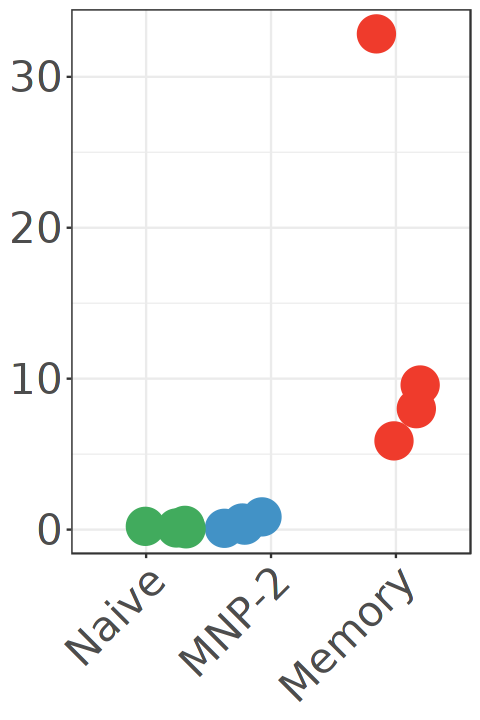

In [414]:
options(repr.plot.width = 4, repr.plot.height = 6)
t_ifng_tcr_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = IFNG, color = celltype)) + geom_jitter(size=10) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 25, angle = 45, vjust = 1, hjust = 1), 
              axis.text.y = element_text(size = 25),
              axis.title.x = element_blank(),
              axis.title.y = element_blank(),
              legend.position = 'none')

In [415]:
# Open a pdf file
pdf("plots/ifng_dot_tcr.pdf", width = 4, height = 6) 
# 2. Create a plot
options(repr.plot.width = 4, repr.plot.height = 6)
t_ifng_tcr_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = IFNG, color = celltype)) + geom_jitter(size=10) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 25, angle = 45, vjust = 1, hjust = 1), 
              axis.text.y = element_text(size = 25),
              axis.title.x = element_blank(),
              axis.title.y = element_blank(),
              legend.position = 'none')
# Close the pdf file
dev.off() 

png 
  2

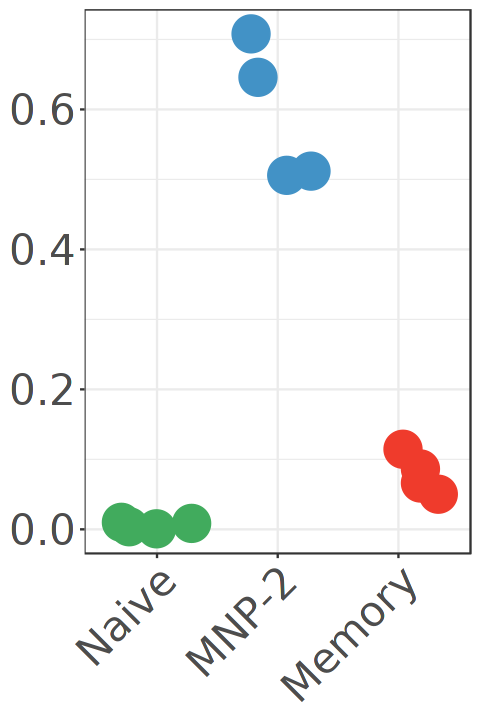

In [416]:
options(repr.plot.width = 4, repr.plot.height = 6)
t_ifng_tcr_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = SPRY2, color = celltype)) + geom_jitter(size=10) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 25, angle = 45, vjust = 1, hjust = 1), 
              axis.text.y = element_text(size = 25),
              axis.title.x = element_blank(),
              axis.title.y = element_blank(),
              legend.position = 'none')

In [417]:
# Open a pdf file
pdf("plots/spry2_dot_tcr.pdf", width = 4, height = 6) 
# 2. Create a plot
options(repr.plot.width = 4, repr.plot.height = 6)
t_ifng_tcr_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = SPRY2, color = celltype)) + geom_jitter(size=10) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 25, angle = 45, vjust = 1, hjust = 1), 
              axis.text.y = element_text(size = 25),
              axis.title.x = element_blank(),
              axis.title.y = element_blank(),
              legend.position = 'none')
# Close the pdf file
dev.off() 

png 
  2

# Ext Fig 10E

In [316]:
tcr <- SetIdent(tcr, value = 'cell.type')
tcr_core <- subset(tcr, idents = c('Naive', 'MNP-2', 'Memory'))

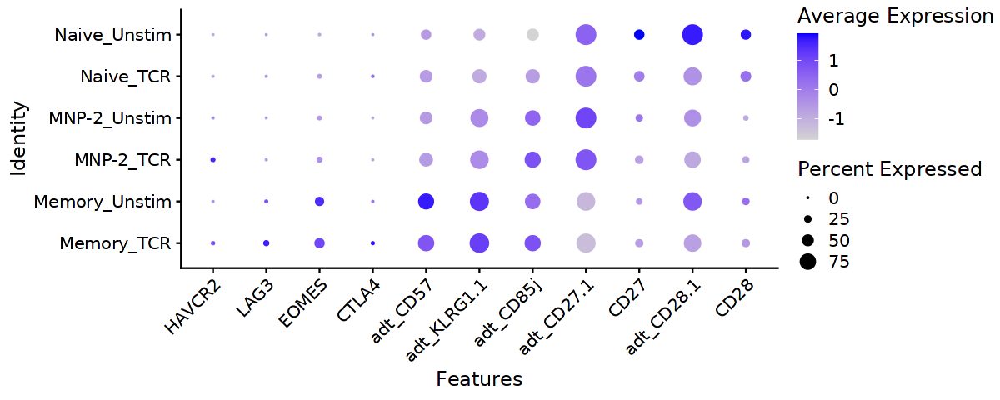

In [333]:
options(repr.plot.width = 10, repr.plot.height = 4)
DotPlot(tcr_core, group.by = 'celltype_stim', features = c('HAVCR2','LAG3','EOMES','CTLA4','adt_CD57','adt_KLRG1.1','adt_CD85j','adt_CD27.1','CD27','adt_CD28.1','CD28')) & RotatedAxis()

In [347]:
# Open a pdf file
pdf("plots/extfig9_dotplot_tcr.pdf", width = 10, height = 4) 
# 2. Create a plot
DotPlot(tcr_core, group.by = 'celltype_stim', features = c('HAVCR2','LAG3','EOMES','CTLA4','adt_CD57','adt_KLRG1.1','adt_CD85j','adt_CD27.1','CD27','adt_CD28.1','CD28')) & RotatedAxis()
# Close the pdf file
dev.off() 

png 
  2

# Ext Fig 10F

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


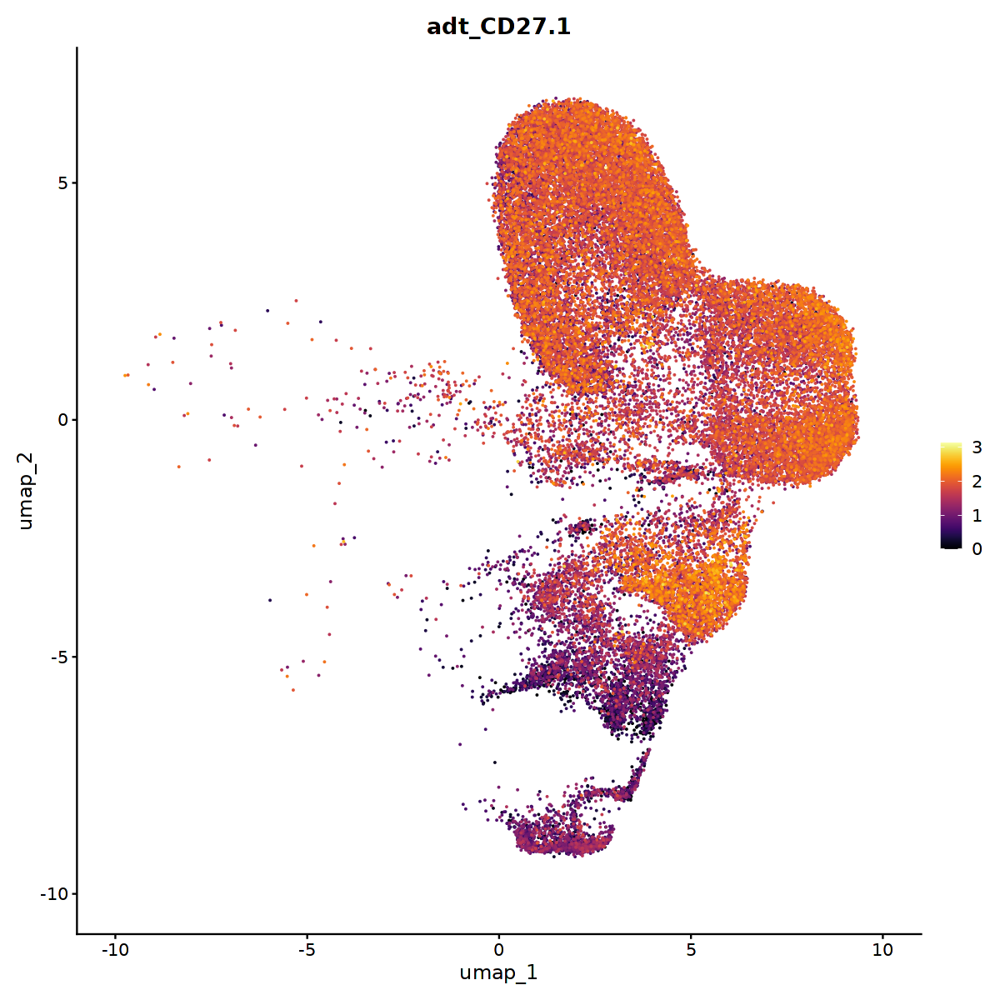

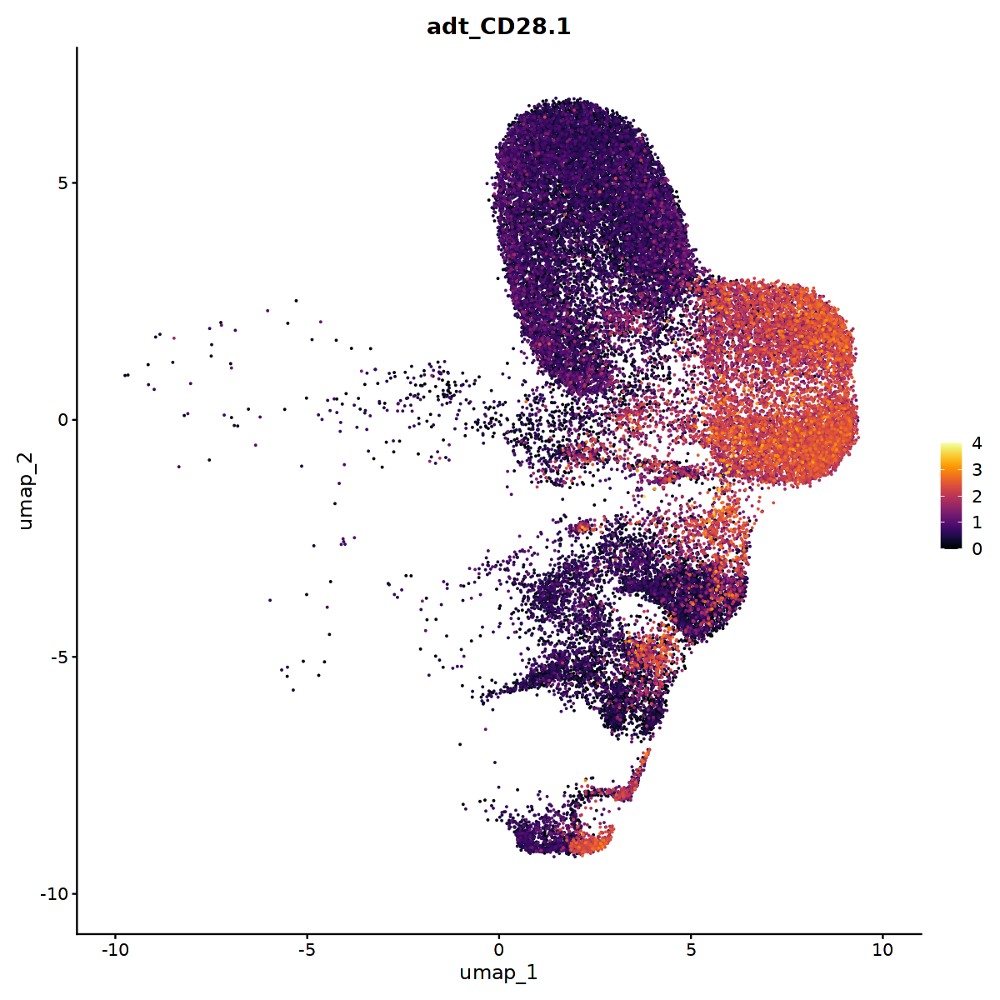

In [327]:
options(repr.plot.width = 10, repr.plot.height = 10)
FeaturePlot(tcr, features = 'adt_CD27.1', order = TRUE) & scale_colour_viridis(option = 'inferno')
FeaturePlot(tcr, features = 'adt_CD28.1', order = TRUE) & scale_colour_viridis(option = 'inferno')

In [348]:
# Open a pdf file
pdf("plots/tcr_CD27_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
FeaturePlot(tcr, features = 'adt_CD27.1', order = TRUE) & scale_colour_viridis(option = 'inferno')
# Close the pdf file
dev.off() 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

In [349]:
# Open a pdf file
pdf("plots/tcr_CD28adt_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
FeaturePlot(tcr, features = 'adt_CD28.1', order = TRUE) & scale_colour_viridis(option = 'inferno')
# Close the pdf file
dev.off() 

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

# Ext Fig 10G

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


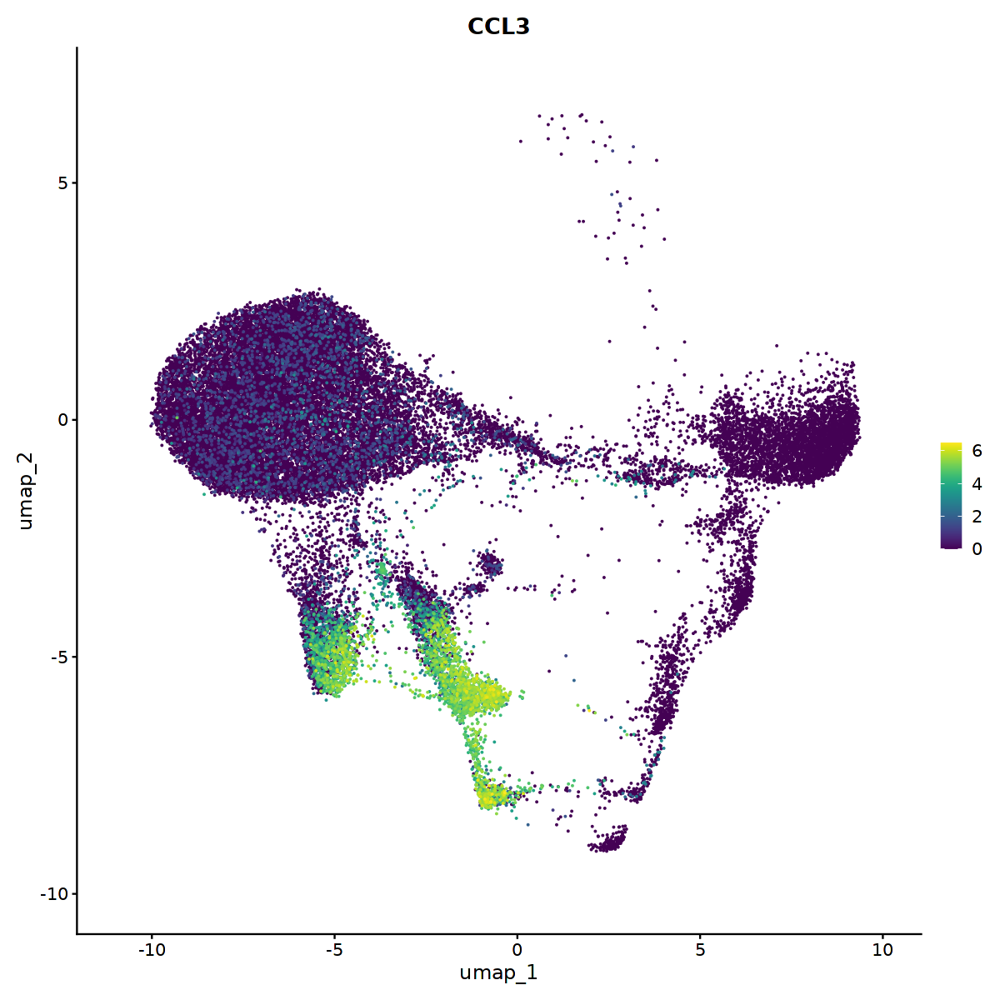

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


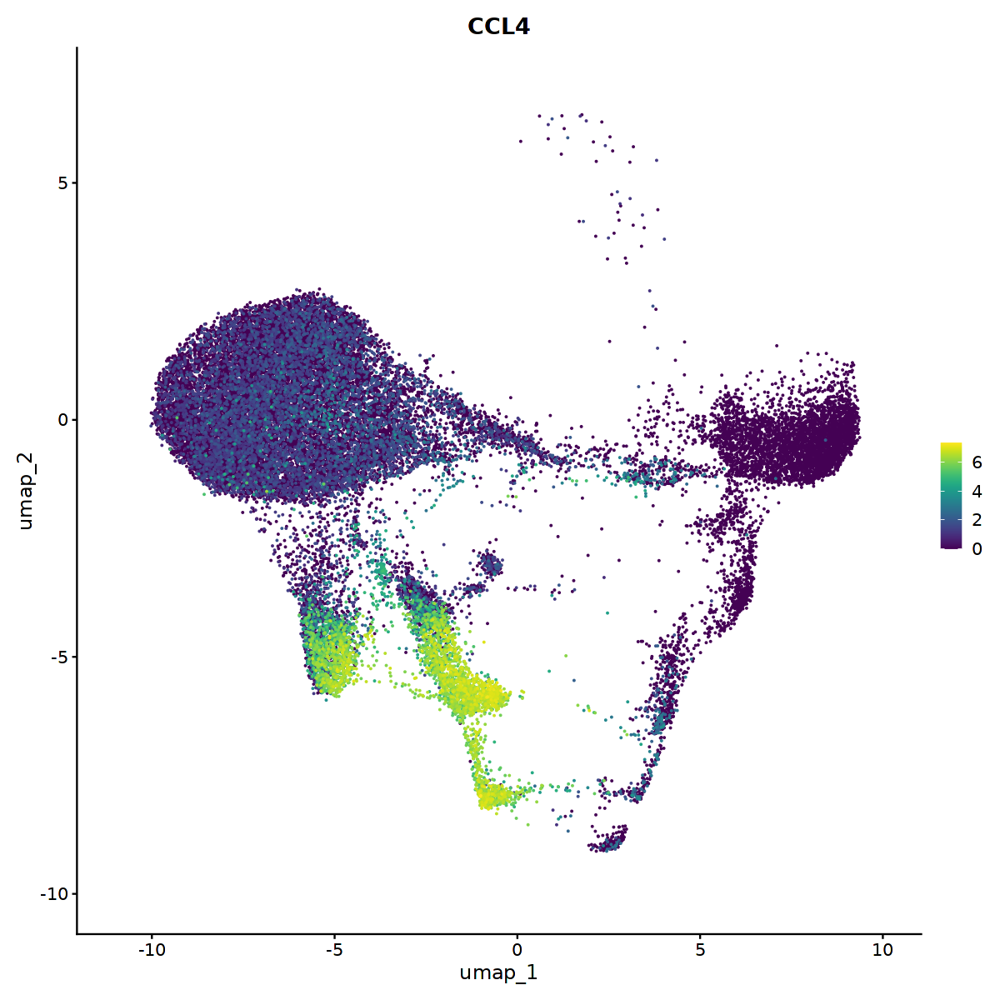

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


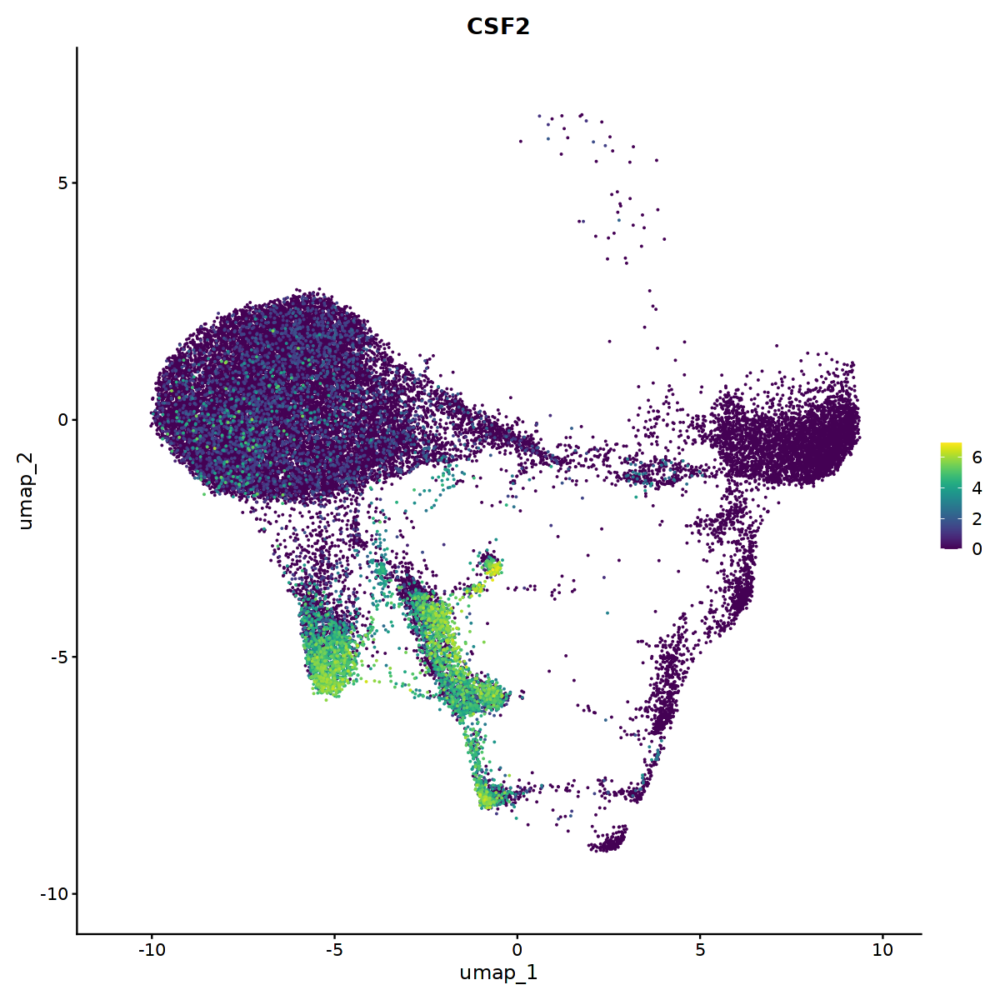

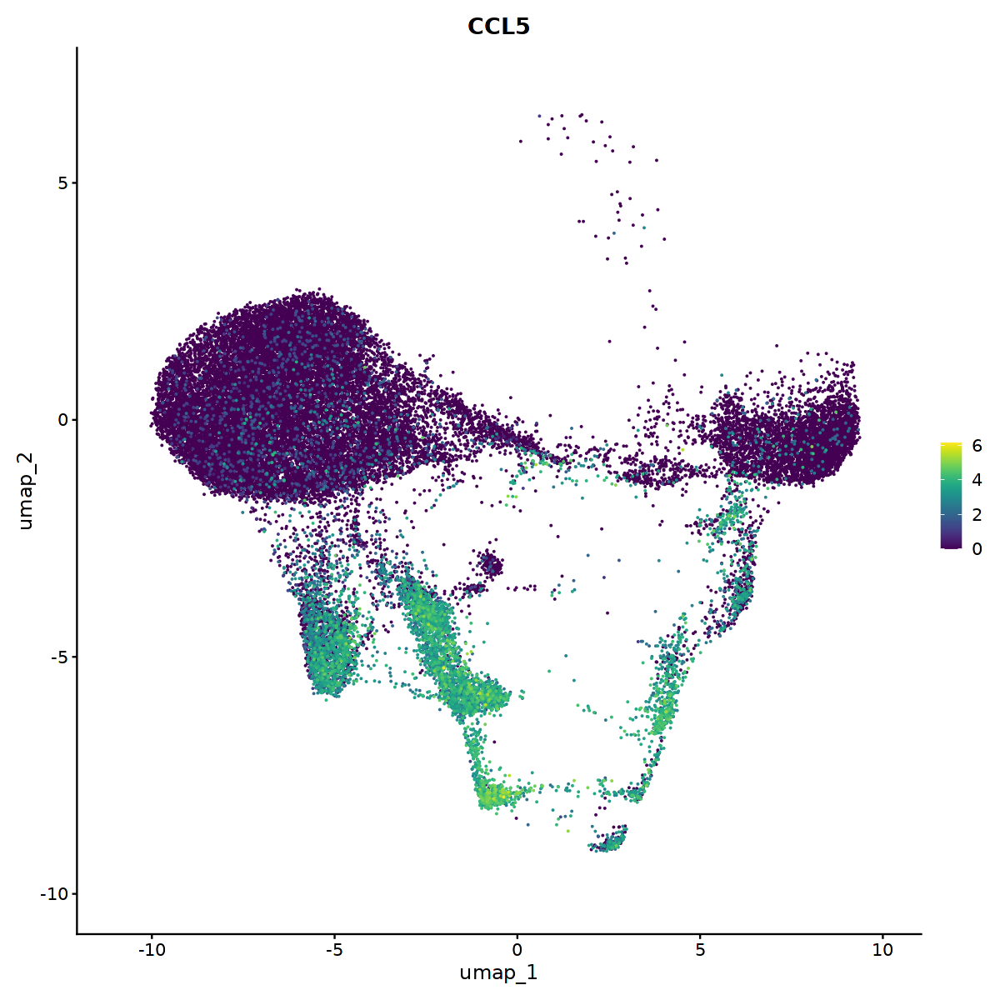

In [384]:
options(repr.plot.width = 10, repr.plot.height = 10)
FeaturePlot(pma, features = 'CCL3', order = TRUE) & scale_colour_viridis()
FeaturePlot(pma, features = 'CCL4', order = TRUE) & scale_colour_viridis()
FeaturePlot(pma, features = 'CSF2', order = TRUE) & scale_colour_viridis()
FeaturePlot(pma, features = 'CCL5', order = TRUE) & scale_colour_viridis()

In [350]:
# Open a pdf file
pdf("plots/PMA_CCL3_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
FeaturePlot(pma, features = 'CCL3', order = TRUE) & scale_colour_viridis()
# Close the pdf file
dev.off()

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

In [351]:
# Open a pdf file
pdf("plots/PMA_CCL4_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
FeaturePlot(pma, features = 'CCL4', order = TRUE) & scale_colour_viridis()
# Close the pdf file
dev.off()

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

In [352]:
# Open a pdf file
pdf("plots/PMA_CSF2_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
FeaturePlot(pma, features = 'CSF2', order = TRUE) & scale_colour_viridis()
# Close the pdf file
dev.off()

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

In [385]:
# Open a pdf file
pdf("plots/PMA_CCL5_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
FeaturePlot(pma, features = 'CCL5', order = TRUE) & scale_colour_viridis()
# Close the pdf file
dev.off()

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

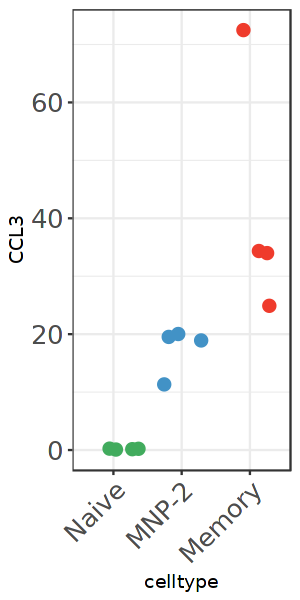

In [357]:
options(repr.plot.width = 2.5, repr.plot.height = 5)
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = CCL3, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')

In [360]:
# Open a pdf file
pdf("plots/PMA_CCL3_avg_exp_plot.pdf", width = 2.5, height = 5) 
# 2. Create a plot
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = CCL3, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')
# Close the pdf file
dev.off()

png 
  2

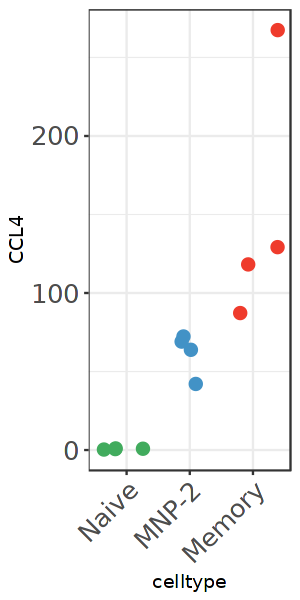

In [358]:
options(repr.plot.width = 2.5, repr.plot.height = 5)
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = CCL4, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')

In [361]:
# Open a pdf file
pdf("plots/PMA_CCL4_avg_exp_plot.pdf", width = 2.5, height = 5) 
# 2. Create a plot
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = CCL4, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')
# Close the pdf file
dev.off()

png 
  2

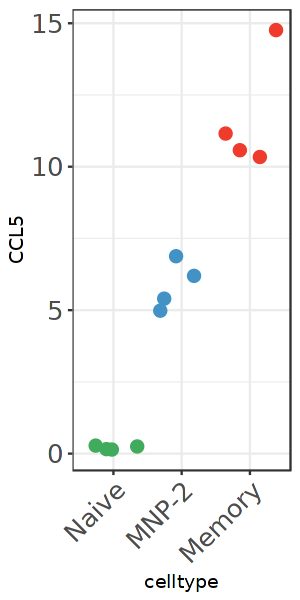

In [390]:
options(repr.plot.width = 2.5, repr.plot.height = 5)
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = CCL5, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')

In [391]:
# Open a pdf file
pdf("plots/PMA_CCL5_avg_exp_plot.pdf", width = 2.5, height = 5) 
# 2. Create a plot
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = CCL5, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')
# Close the pdf file
dev.off()

png 
  2

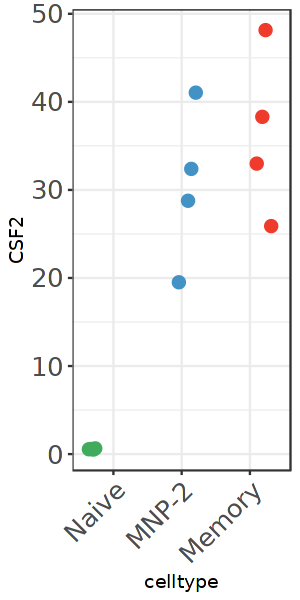

In [359]:
options(repr.plot.width = 2.5, repr.plot.height = 5)
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = CSF2, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')

In [362]:
# Open a pdf file
pdf("plots/PMA_CSF2_avg_exp_plot.pdf", width = 2.5, height = 5) 
# 2. Create a plot
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = CSF2, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')
# Close the pdf file
dev.off()

png 
  2

# Ext Fig 10H

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.
Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


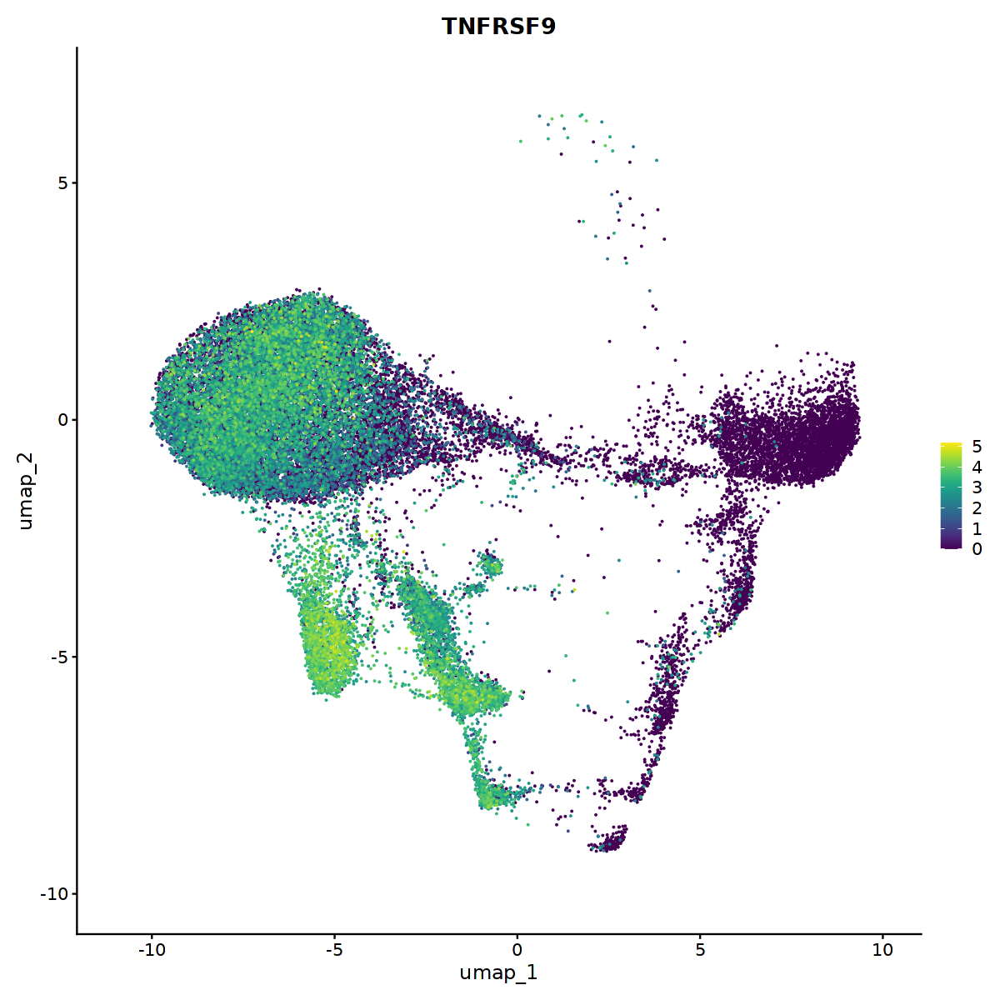

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


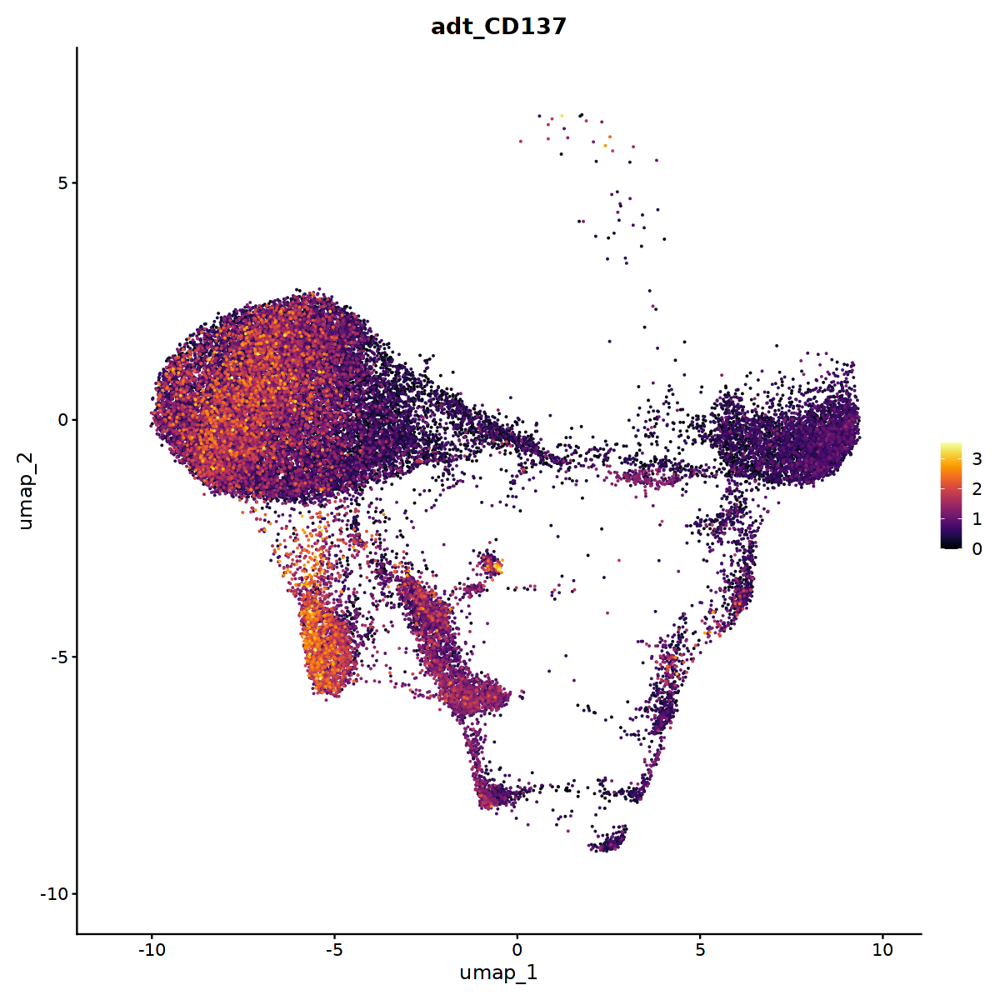

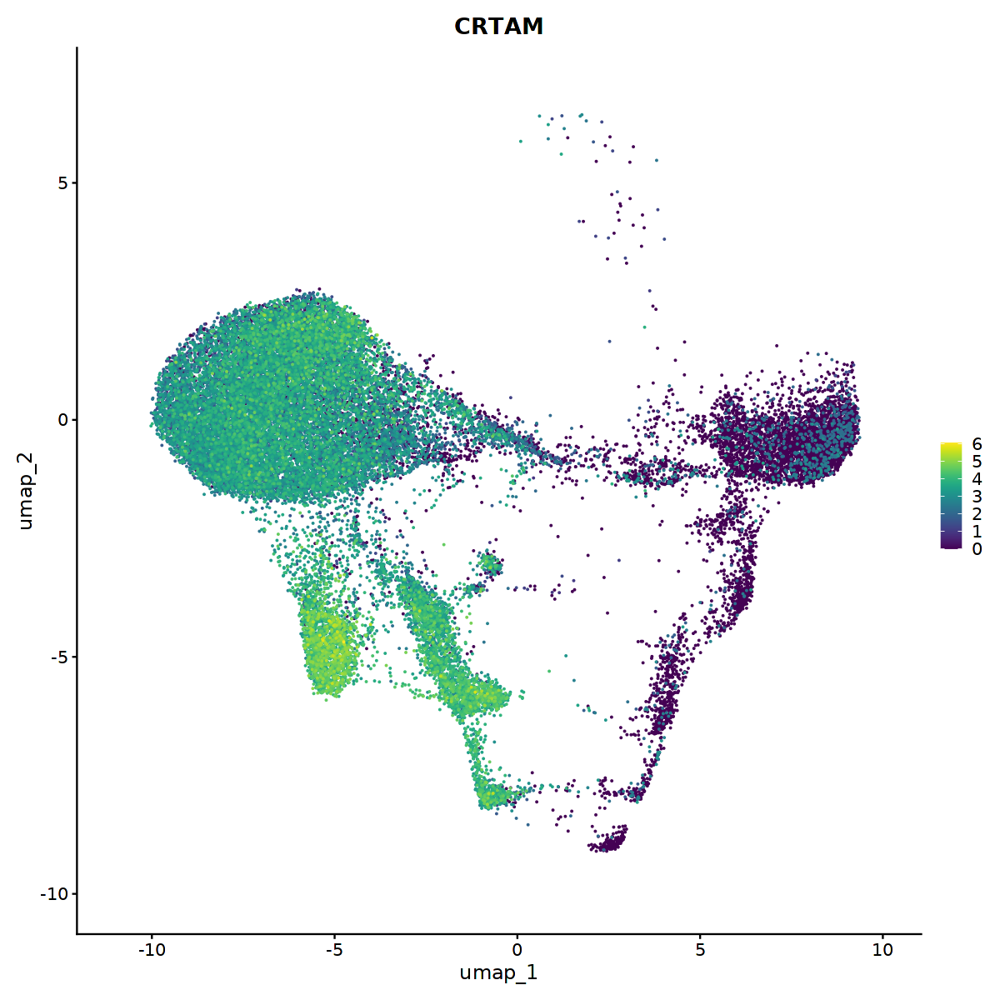

In [ ]:
options(repr.plot.width = 10, repr.plot.height = 10)
FeaturePlot(pma, features = 'TNFRSF9', order = TRUE) & scale_colour_viridis()
FeaturePlot(pma, features = 'adt_CD137', order = TRUE) & scale_colour_viridis(option = 'inferno')
# FeaturePlot(pma, features = 'CRTAM', order = TRUE) & scale_colour_viridis()

In [363]:
# Open a pdf file
pdf("plots/PMA_TNFRSF9_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
FeaturePlot(pma, features = 'TNFRSF9', order = TRUE) & scale_colour_viridis()
# Close the pdf file
dev.off()

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

In [364]:
# Open a pdf file
pdf("plots/PMA_adt_CD137_umap.pdf", width = 10, height = 10) 
# 2. Create a plot
FeaturePlot(pma, features = 'adt_CD137', order = TRUE) & scale_colour_viridis(option = 'inferno')
# Close the pdf file
dev.off()

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


png 
  2

In [366]:
# Open a pdf file
pdf("plots/PMA_TNFRSF9_avg_exp_plot.pdf", width = 2.5, height = 5) 
# 2. Create a plot
t_ifng_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = TNFRSF9, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')
# Close the pdf file
dev.off()

png 
  2

In [368]:
cd137_pma_exp <- AverageExpression(pma_only_trim, features = c('CD137','CD27.1'), assay = 'ADT', group.by = 'celltype_sampleID')

In [369]:
cd137_pma_exp <- as.data.frame(cd137_pma_exp$ADT)

In [370]:
head(cd137_pma_exp)
t_cd137_pma_exp <- as.data.frame(t(cd137_pma_exp))
head(t_cd137_pma_exp)

,Memory-UP1002,Memory-UP1003,Memory-UP1006,Memory-UP1010,MNP-2-UP1002,MNP-2-UP1003,MNP-2-UP1006,MNP-2-UP1010,Naive-UP1002,Naive-UP1003,Naive-UP1006,Naive-UP1010
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
CD137,15.84734,9.062774,24.82615,14.086266,25.92737,14.52830,38.92717,14.349227,11.94412,7.772011,13.17097,9.578269
CD27.1,12.90769,7.255474,18.65508,6.988649,21.78771,17.09623,40.98819,9.484536,17.64176,14.692935,32.61666,8.342885


,CD137,CD27.1
,<dbl>,<dbl>
Memory-UP1002,15.847337,12.907692
Memory-UP1003,9.062774,7.255474
Memory-UP1006,24.826147,18.655076
Memory-UP1010,14.086266,6.988649
MNP-2-UP1002,25.927374,21.787709
MNP-2-UP1003,14.528302,17.096226


In [371]:
t_cd137_pma_exp$celltype <- c('Memory','Memory','Memory','Memory','MNP-2','MNP-2','MNP-2','MNP-2','Naive','Naive','Naive','Naive')
# colnames(t_ifng_pma_exp) <- c('IFNG','celltype')
head(t_cd137_pma_exp)

,CD137,CD27.1,celltype
,<dbl>,<dbl>,<chr>
Memory-UP1002,15.847337,12.907692,Memory
Memory-UP1003,9.062774,7.255474,Memory
Memory-UP1006,24.826147,18.655076,Memory
Memory-UP1010,14.086266,6.988649,Memory
MNP-2-UP1002,25.927374,21.787709,MNP-2
MNP-2-UP1003,14.528302,17.096226,MNP-2


In [372]:
# Open a pdf file
pdf("plots/PMA_CD137_avg_exp_plot.pdf", width = 2.5, height = 5) 
# 2. Create a plot
t_cd137_pma_exp %>% 
    mutate(celltype = factor(celltype, levels = c('Naive','MNP-2','Memory'))) %>%
    ggplot(aes(x = celltype, y = CD137, color = celltype)) + geom_jitter(size = 3) + 
        scale_color_manual(values = c('#41ab5d','#4292c6','#ef3b2c')) +
        theme_bw() +
        theme(axis.text.x = element_text(size = 15, angle = 45, vjust = 1, hjust = 1),
              axis.text.y = element_text(size = 15),
              legend.position = 'none')
# Close the pdf file
dev.off()

png 
  2

# Ext Fig 10I

# Ext Fig 10J